In [2]:
import pandas as pd
import os
from PIL import Image
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D
from IPython.display import display, Image, HTML
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import base64

In [3]:
from matplotlib import font_manager

# Configure font settings
font = {'family': 'sans-serif', 'weight': 'regular', 'size': 20}
plt.rcParams.update({'font.size': 20, 'font.family': 'sans-serif', 'font.weight': 'regular'})

# Use Arial as the sans-serif font
plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['text.usetex'] = False

In [4]:
path = 'C:/Users/aleje/Documents/Mimic_Galaxy_Data'
pathout_plots = 'C:/Users/aleje/Documents/Mimic_Galaxy_Data/Plots/'

In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
c_m_n = pd.read_csv(path+'/control_morphology_nonparametric_multisource.csv')
c_m_n_new =c_m_n[(c_m_n['flag_o3']<=1) & (c_m_n['flag_f210']<=1) & (c_m_n['flag_f180']<=1) & (c_m_n['gini_f180']!=-99) & (c_m_n['gini_o3']!=-99) & (c_m_n['zfourge_id']!=15287.0)]
e_m_n = pd.read_csv(path+'/eelg_morphology_nonparametric_multisource.csv')
e_m_n_new=e_m_n[(e_m_n['flag_o3']<=1) & (e_m_n['flag_f210']<=1) & (e_m_n['flag_f180']<=1) & (e_m_n['gini_o3']!=-99)]

In [ ]:
c_m_n_new

In [ ]:
# Picking Galaxy IDs with Smoothness of 0
smoothness_o3 = c_m_n_new['smoothness_o3']
o3_0_indices = smoothness_o3[smoothness_o3 == 0].index
print(len(c_m_n_new.loc[o3_0_indices, 'zfourge_id']))
print(c_m_n_new.loc[o3_0_indices, 'zfourge_id'])

In [ ]:
e_m_n_new

In [8]:
c_m_n_reclass = c_m_n_new.copy()
e_m_n_reclass = e_m_n_new.copy()

cmn_EELG_sel = c_m_n_reclass[(c_m_n_reclass['o3_ew']>=600)]
emn_EELG_sel = e_m_n_reclass[(e_m_n_reclass['o3_ew']>=600)]
# Combines the panda frames
EELG_new = pd.concat([cmn_EELG_sel, emn_EELG_sel], ignore_index=True).drop_duplicates(subset='zfourge_id')

cmn_con_sel = c_m_n_reclass[(c_m_n_reclass['o3_ew']<600)]
emn_con_sel = e_m_n_reclass[(e_m_n_reclass['o3_ew']<600)]

con_new = pd.concat([cmn_con_sel, emn_con_sel], ignore_index=True).drop_duplicates(subset='zfourge_id')

,zfourge_id,lmass,lsfr,flag_f210,gini_f210,m20_f210,conc_f210,asym_f210,smoothness_f210,flag_f180,gini_f180,m20_f180,conc_f180,asym_f180,smoothness_f180,flag_o3,gini_o3,m20_o3,conc_o3,asym_o3,smoothness_o3,flux_f210,flux_f180,flux_o3,r80_f210,r80_f180,r80_o3,o3_ew
0,7129.0,8.60,1.49,0.0,0.425961,-1.065712,1.863511,0.237000,0.045564,0.0,0.477918,-0.996904,2.562706,0.123433,0.008787,0.0,0.433060,-0.990795,1.826556,0.111609,0.042104,49.739460,18.594547,30.787642,11.335383,11.616449,10.468204,657.865090
1,7387.0,9.41,0.22,0.0,0.496631,-1.198950,2.400075,0.164116,0.062720,0.0,0.499094,-1.097508,2.619919,0.084928,-0.014420,0.0,0.470662,-1.020614,2.128934,0.076856,0.000000,33.032314,10.043209,22.910364,7.824741,10.807706,6.289165,906.369989
2,8366.0,9.31,0.32,0.0,0.534915,-0.719924,1.558184,0.208265,-0.033814,0.0,0.465249,-0.941986,1.844358,0.370870,0.100352,0.0,0.545251,-0.679766,1.410382,0.157553,0.010634,93.014297,35.853798,55.193054,18.385705,16.983412,16.225399,611.639169
3,9048.0,8.15,1.56,0.0,0.565687,-1.304038,2.365814,0.439754,0.082210,1.0,0.532412,-1.157439,2.654756,0.176617,0.041950,0.0,0.565692,-1.435243,2.844671,0.527244,0.091486,35.779877,8.499331,27.130951,9.056910,12.050273,7.914125,1268.312513
4,9101.0,8.72,1.80,0.0,0.520939,-1.671930,2.823283,0.211673,0.088018,0.0,0.546538,-1.348109,2.982434,0.238148,0.053551,0.0,0.535730,-1.684455,2.705458,0.092419,0.000000,78.034294,28.337757,49.375080,6.551751,8.989750,5.702684,692.290494
5,9845.0,8.21,1.33,0.0,0.517145,-1.143595,2.483513,0.211471,0.066640,0.0,0.491086,-1.453536,2.576273,0.048247,0.047404,0.0,0.520373,-1.127453,2.491820,0.234171,0.095672,25.912338,10.252813,15.531706,7.888694,7.532685,7.372582,601.896939
6,10050.0,8.43,1.44,1.0,0.533620,-1.195057,2.577386,0.223774,0.080994,1.0,0.507304,-0.716161,3.081751,0.089725,0.009195,1.0,0.508194,-1.631205,2.608732,0.106201,0.000000,11.427883,3.056097,8.312807,6.603883,10.153591,6.195831,1080.753521
7,10685.0,9.14,0.06,0.0,0.499050,-1.340019,2.403479,0.216195,0.059466,0.0,0.514918,-1.662557,2.868168,-0.053908,0.034858,0.0,0.503285,-1.162893,2.125474,0.229719,0.000000,22.846645,7.945925,14.869308,6.890637,8.464691,6.234945,743.519480
8,11172.0,10.23,0.84,0.0,0.500381,-1.731201,2.749631,0.161768,0.067558,1.0,0.498770,-1.652627,2.654853,0.177218,0.049506,0.0,0.510148,-1.706943,2.772200,0.126898,0.000000,62.971050,16.544207,46.436859,6.410018,6.716770,6.290837,1115.226089
9,12030.0,8.55,1.58,0.0,0.540982,-0.949730,1.863645,0.731908,0.033992,0.0,0.492411,-0.856358,1.973269,0.533056,0.022534,0.0,0.556197,-0.993228,1.782914,0.706869,0.036612,55.645283,14.695022,40.691055,11.846225,11.791610,11.795220,1100.207882


In [9]:
# Linear equation parameters
m_ml = -0.14  # Slope
c_ml = 0.33  # Intercept

def merger_rat_n_err_180(con_data, EELG_data, mean_c_name, sd_c_name, mean_e_name, sd_e_name):
    
    global_vars = globals() # Access global variables dictionary
    
    # Finding the Merger Ratio 1000 times for Control sample
    ratios_c_m_n_180_boot = []

    for _ in range(1000):
    #      Selects points randomly (with repeats)    
        random_points_c_m_n_180 = con_data[['m20_f180','gini_f180']].sample(n=len(EELG_data), replace=True)
    #     Merger line with 18 points that match     
        y_merger_cmn_180_ratio_sample = m_ml*random_points_c_m_n_180['m20_f180'] + c_ml
    #     Counting points above line    
        above_merger_c_m_n_180_boot = (random_points_c_m_n_180['gini_f180'].values > y_merger_cmn_180_ratio_sample).sum()
    #     Findning ratio of above line : total     
        ratio_above_total_c_m_n_180_boot = above_merger_c_m_n_180_boot / len(EELG_data)
    #     Creating a long set of all the ratios    
        ratios_c_m_n_180_boot.append(ratio_above_total_c_m_n_180_boot)

    # Find the mean and SD of the 1000 trials. Print Results. 
    mean_c = np.mean(ratios_c_m_n_180_boot)
    sd_c = np.std(ratios_c_m_n_180_boot)
    
    # Assign to global variables
    global_vars[mean_c_name] = mean_c
    global_vars[sd_c_name] = sd_c

    # Repeat for EELGS
    ratios_e_m_n_180_boot = []

    for _ in range(1000):
        random_points_e_m_n_180 = EELG_data[['m20_f180','gini_f180']].sample(n=len(EELG_data), replace=True)
        y_merger_emn_180_ratio_sample = m_ml*random_points_e_m_n_180['m20_f180'] + c_ml
        above_merger_e_m_n_180_boot = (random_points_e_m_n_180['gini_f180'].values > y_merger_emn_180_ratio_sample).sum()
        ratio_above_total_e_m_n_180_boot = above_merger_e_m_n_180_boot / len(EELG_data)
        ratios_e_m_n_180_boot.append(ratio_above_total_e_m_n_180_boot)

    mean_e = np.mean(ratios_e_m_n_180_boot)
    sd_e = np.std(ratios_e_m_n_180_boot)
    
    # Assign to global variables
    global_vars[mean_e_name] = mean_e
    global_vars[sd_e_name] = sd_e
    
    return print(f"""Average Control Merger Ratio after 1000 Loops (Bootstrap) for F180: {mean_c}
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F180: {sd_c}
    
Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F180: {mean_e}
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F180: {sd_e}""")

merger_rat_n_err_180(c_m_n_new, e_m_n_new, 'average_merg_ratio_c_m_n_180_boot', 'error_std_dev_merg_ratio_c_m_n_180_boot', 'average_merg_ratio_e_m_n_180_boot', 'error_std_dev_merg_ratio_e_m_n_180_boot')

Average Control Merger Ratio after 1000 Loops (Bootstrap) for F180: 0.283
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F180: 0.10287778917809635
    
Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F180: 0.6093888888888889
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F180: 0.11587081727638023


In [10]:
merger_rat_n_err_180(con_new, EELG_new, 'c_mean_mr_180', 'c_sd_err_180', 'e_mean_mr_180', 'e_sd_err_180')

Average Control Merger Ratio after 1000 Loops (Bootstrap) for F180: 0.22266666666666668
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F180: 0.08312123007324236
    
Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F180: 0.7536666666666666
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F180: 0.08561720361910656


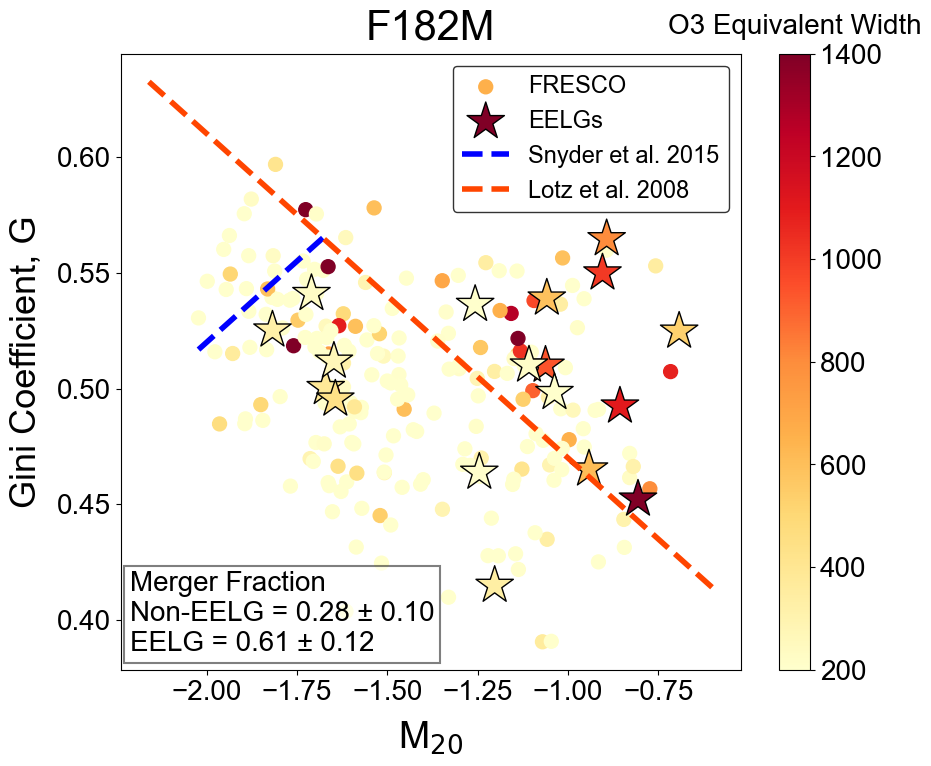

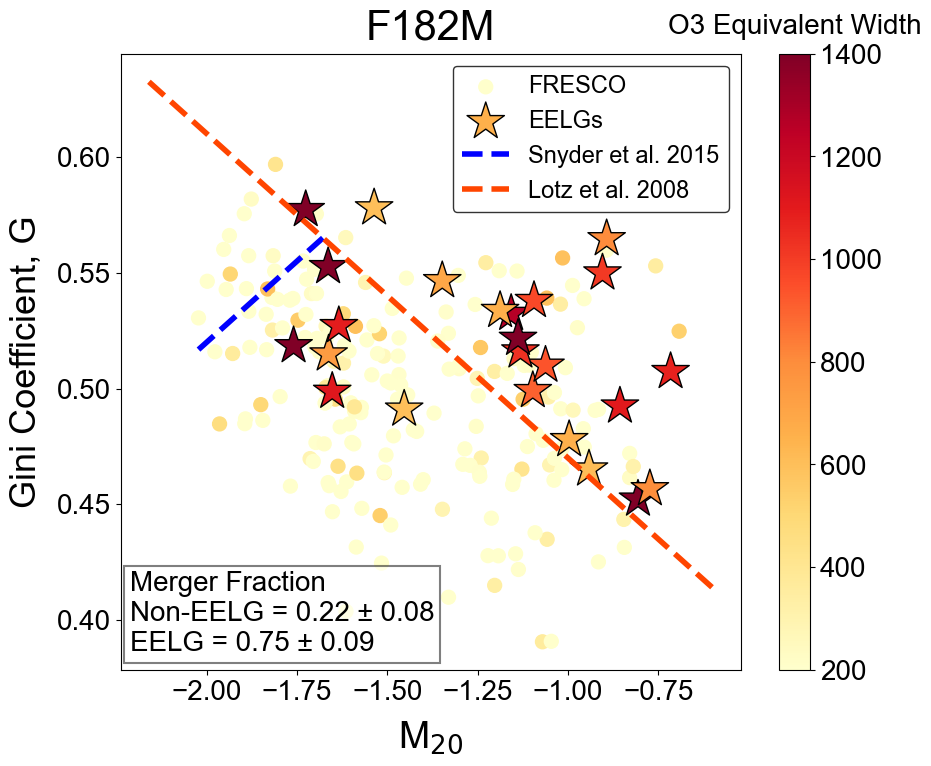

In [11]:
# Variables for Elliptical-Spiral Line
m_es = 0.14  
c_es = 0.8

def make_180_plots(con_data, EELG_data, mean_c, sd_c, mean_e, sd_e, name):

    from PIL import Image
    # Selecting x and y data from tables for f180
    x_data_c_m_n_180 = con_data['m20_f180']
    y_data_c_m_n_180 = con_data['gini_f180']

    x_data_e_m_n_180 = EELG_data['m20_f180']
    y_data_e_m_n_180 = EELG_data['gini_f180']

    # Plotting Scatter Plot 
    fig_180 = plt.figure(figsize=(10, 8))
    plt.scatter(x_data_c_m_n_180, y_data_c_m_n_180, label='FRESCO', s=100, cmap='YlOrRd',c=con_data['o3_ew'], vmin=200, vmax=1400)
    plt.scatter(x_data_e_m_n_180, y_data_e_m_n_180, label='EELGs', marker='*', s=800, edgecolor='black', cmap='YlOrRd',c=EELG_data['o3_ew'], vmin=200, vmax=1400)

    # y values for ratio
    y_merger_cmn_180 = m_ml*x_data_c_m_n_180 + c_ml
    y_merger_emn_180 = m_ml*x_data_e_m_n_180 + c_ml

    # # Scatter plot for 'e_m_n' with color coding
    # above_line_mask = e_m_n_new['gini_f180'] > y_merger_emn_180
    # below_line_mask = e_m_n_new['gini_f180'] <= y_merger_emn_180
    # plt.scatter(e_m_n_new.loc[below_line_mask, 'm20_f180'], e_m_n_new.loc[below_line_mask, 'gini_f180'],  label = 'Non-Merger EELG', color='darkorange')

    # # Scatter plot for 'e_m_n' merger galaxies
    # plt.scatter(e_m_n_new.loc[above_line_mask, 'm20_f180'], e_m_n_new.loc[above_line_mask, 'gini_f180'], label='Merger EELGs', color='magenta')

    # Max and Min Points for ESDL (f180)
    x_elip_spir_180 = np.linspace(min(c_m_n_new['m20_f180'].min(), e_m_n_new['m20_f180'].min()),
                           max(c_m_n_new['m20_f180'].max(), e_m_n_new['m20_f180'].max()), 100)

    # Restrict x_values to have a maximum value of -1.68
    x_elip_spir_180 = np.clip(x_elip_spir_180, x_elip_spir_180.min(), -1.678571429)

    # ESLD (Ellipse-Spiral Line Divide) Equation and Plotting
    y_elip_spir_180 = m_es * x_elip_spir_180 + c_es
    plt.plot(x_elip_spir_180, y_elip_spir_180, label='Snyder et al. 2015', color='blue', linestyle='dashed', linewidth=4)

    # Plot the Merger Divide line
    x_merg_ln_180 = np.linspace(-2.16, -0.6, 100)
    y_merg_ln_180 = m_ml * x_merg_ln_180 + c_ml

    plt.plot(x_merg_ln_180, y_merg_ln_180, label='Lotz et al. 2008', color='orangered', linestyle='dashed', linewidth=4)

    # Set plot labels and title
    plt.xlabel(f'M$_{{20}}$', fontsize = 27, labelpad=10, fontname='Arial')
    plt.ylabel('Gini Coefficient, G', fontsize = 26, labelpad=10, fontname='Arial')
    plt.title('F182M', fontsize = 30, pad=10, fontname='Arial')

    # Showing the Ratio on the Scatter Plot
    plt.text(0.015, 0.03, f'''Merger Fraction \nNon-EELG = {mean_c:.2f} ± {sd_c:.2f}\nEELG = {mean_e:.2f} ± {sd_e:.2f}''',
             transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='black', linewidth = 1.5))

    plt.legend(edgecolor='black', fontsize=17)

    # Colour Bar
    cbar = plt.colorbar() 
    cbar.set_label('O3 Equivalent Width', fontname='Arial', fontsize = 20, rotation=0)
    # Sets the location of the colour bar label
    cbar.ax.yaxis.set_label_coords(0.5, 1.065)

    plt.show()

    # Convert the figure to a NumPy array
    fig_180.canvas.draw()
    image_array_180 = np.array(fig_180.canvas.renderer.buffer_rgba())
    # Convert the NumPy array to a PIL Image
    image_180 = Image.fromarray(image_array_180)

    # Convert the image to 'RGB' mode
    image_180 = image_180.convert('RGB')

    # Save PDF
    image_180.save(pathout_plots + f'F182M_plot_{name}.png', dpi=(3000, 3000))
    
make_180_plots(c_m_n_new, e_m_n_new, average_merg_ratio_c_m_n_180_boot, error_std_dev_merg_ratio_c_m_n_180_boot, average_merg_ratio_e_m_n_180_boot, error_std_dev_merg_ratio_e_m_n_180_boot, 'old')
make_180_plots(con_new, EELG_new, c_mean_mr_180, c_sd_err_180, e_mean_mr_180, e_sd_err_180, 'new')

In [12]:
# Finding the Merger Ratio 1000 times for Control sample

copy_for_sd_180 = c_m_n_new.copy()

# Value to exclude
exclude_sd_180 = copy_for_sd_180[c_m_n_new['zfourge_id'] != 12307.0]

# Select Asym Colum to find Standard Deviation (S.D.)
c_m_n_new_sd_180 = exclude_sd_180[['asym_f180']]
e_m_n_new_sd_180 = e_m_n_new.copy()[['asym_f180']]

# Append the DataFrames for S.D.
all_results_asym_180 = pd.concat([c_m_n_new_sd_180, e_m_n_new_sd_180], ignore_index=True)

# Find S.D. of combined Galaxy Data
sigma_180 = np.std(all_results_asym_180).item()

ratios_c_AS_180_boot = []

# 1000x Loop
for _ in range(1000):
#      Selects 18 points randomly (with repeats)    
    random_points_c_m_n_180 = exclude_sd_180[['smoothness_f180', 'asym_f180']].sample(n=18, replace=True)
#     Finding Expected Asym Value based on Control Linear Regression
    asym_exp_c_180 = 1.09*random_points_c_m_n_180['smoothness_f180']  + 0.08
#     Finding the difference of Actual Asym from Expected
    y_data_c_m_n_merg_AS_180 = (random_points_c_m_n_180['asym_f180'] - asym_exp_c_180)/sigma_180    
#     Counting points above line    
    above_merger_c_m_n_180_boot = (y_data_c_m_n_merg_AS_180 > 2.5*sigma_180).sum()
#     Findning ratio of above line : total     
    ratio_above_total_c_m_n_180_boot = above_merger_c_m_n_180_boot / 18
#     Creating a long set of all the ratios    
    ratios_c_AS_180_boot.append(ratio_above_total_c_m_n_180_boot)

# Find the Mean and S.D. (error) of the 1000 trials. Print Results. 
average_merg_ratio_c_m_n_180_boot = np.mean(ratios_c_AS_180_boot)
error_std_dev_merg_ratio_c_m_n_180_boot = np.std(ratios_c_AS_180_boot)
print(f"Average Control Merger Ratio after 1000 Loops (Bootstrap) for F180: {average_merg_ratio_c_m_n_180_boot}")
print(f"""Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F180: {error_std_dev_merg_ratio_c_m_n_180_boot}
""")

# Repeat for EELGS
ratios_e_AS_180_boot = []

for _ in range(1000):
    random_points_e_m_n_180 = e_m_n_new[['smoothness_f180','asym_f180']].sample(n=18, replace=True)
    asym_exp_e_180 = 1.09*random_points_e_m_n_180['smoothness_f180'] + 0.08
    y_data_e_m_n_merg_AS_180 = (random_points_e_m_n_180['asym_f180'] - asym_exp_e_180)/sigma_180
    above_merger_e_m_n_180_boot = (y_data_e_m_n_merg_AS_180.values > 2.5*sigma_180).sum()
    ratio_above_total_e_m_n_180_boot = above_merger_e_m_n_180_boot / 18
    ratios_e_AS_180_boot.append(ratio_above_total_e_m_n_180_boot)

average_merg_ratio_e_m_n_180_boot = np.mean(ratios_e_AS_180_boot)
error_std_dev_merg_ratio_e_m_n_180_boot = np.std(ratios_e_AS_180_boot)
print(f"Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F180: {average_merg_ratio_e_m_n_180_boot}")
print(f"Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F180: {error_std_dev_merg_ratio_e_m_n_180_boot}")

Average Control Merger Ratio after 1000 Loops (Bootstrap) for F180: 0.2694444444444444
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F180: 0.10321229470260691

Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F180: 0.44805555555555554
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F180: 0.11840992565586367


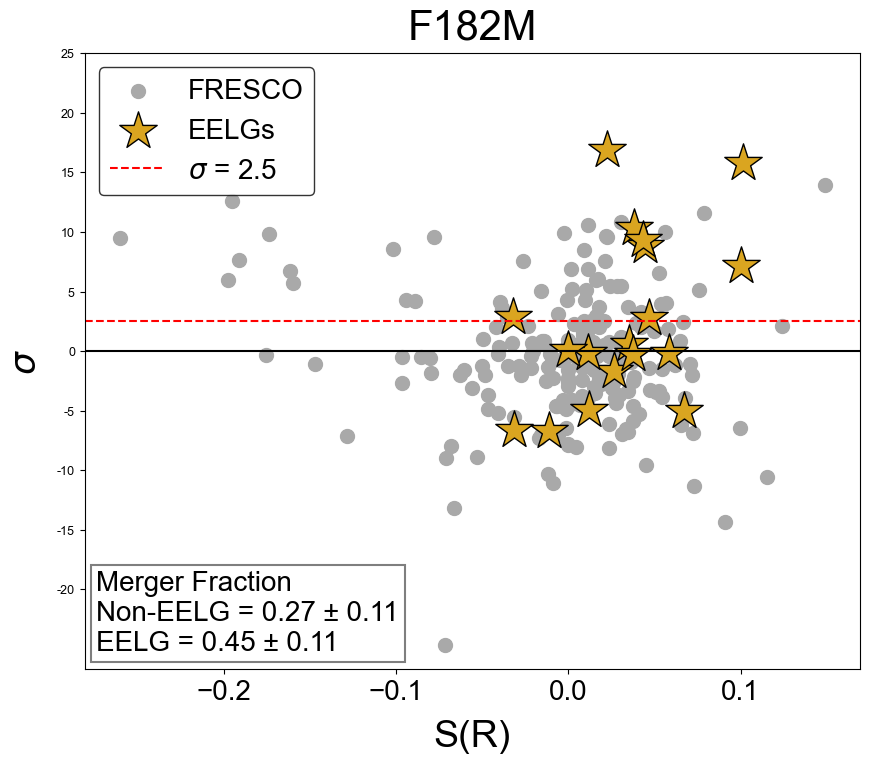

In [96]:
from PIL import Image

# Selecting x and y data from tables for f180 and excluding 12761.0

x_data_c_m_n_180 = c_m_n_new['smoothness_f180']
x_data_c_m_n_180 = x_data_c_m_n_180[c_m_n_new['zfourge_id'] != 12307.0]
y_excl_outl_180 = c_m_n_new['asym_f180']

x_data_e_m_n = e_m_n_new['smoothness_f180']

# Expected Asymmetry from LBF
asym_exp_c_180 = 1.09*x_data_c_m_n_180 + 0.08
# Real Asym Difference in S.D. from Expected
y_data_c_m_n_180 = (y_excl_outl_180[c_m_n_new['zfourge_id'] != 12307.0] - asym_exp_c_180)/sigma_180

x_data_e_m_n_180 = e_m_n_new['smoothness_f180']

# Repeat for EELGs (Asym-Sigma)
asym_exp_e_180 = 1.09*e_m_n_new['smoothness_f180'] + 0.08
y_data_e_m_n_180 = (e_m_n_new['asym_f180'] - asym_exp_e_180)/sigma_180

# Plotting Scatter Plot 
fig_180 = plt.figure(figsize=(10, 8))
plt.scatter(x_data_c_m_n_180, y_data_c_m_n_180, label='FRESCO', s=100, color = 'darkgray')
plt.scatter(x_data_e_m_n_180, y_data_e_m_n_180, label='EELGs', marker='*', s=800, edgecolor='black', color = 'goldenrod')

# Set y-axis ticks and labels in sigma units
sigma_ticks = np.arange(-20, 30, 5)  # Adjust range as needed
plt.yticks(sigma_ticks * sigma_180, labels=[tick for tick in sigma_ticks], fontsize=9)

# Plotting Line y = 2.5*sig
plt.axhline(y=2.5*sigma_180, color='r', linestyle='--', label=f'$\sigma$ = 2.5')
# X-Axis
plt.axhline(y=0, color='black')

# # Count data points above and below the line for each DataFrame
# above_merger_c_m_n_180 = (y_data_c_m_n_180 > 3*sigma_180).sum()

# above_merger_e_m_n_180 = (y_data_e_m_n_180 > 3*sigma_180).sum()

# # Ratios of Control and EELGs Above Merger Line To Total for f180
# ratio_above_below_c_m_n_180 = above_merger_c_m_n_180 / len(y_data_c_m_n_180)
# ratio_above_below_e_m_n_180 = above_merger_e_m_n_180 / len(y_data_e_m_n_180)

# Set plot labels and title
plt.xlabel(f'S(R)', fontsize = 27, labelpad=10, fontname='Arial')
plt.ylabel(f'$\sigma$', fontsize = 26, labelpad=10, fontname='Arial')
plt.title('F182M', fontsize = 30, pad=10, fontname='Arial')

# Showing the Merger Ratio on the Scatter Plot
plt.text(0.015, 0.03, f'''Merger Fraction
Non-EELG = {average_merg_ratio_c_m_n_180_boot:.2f} ± {error_std_dev_merg_ratio_c_m_n_180_boot:.2f}\nEELG = {average_merg_ratio_e_m_n_180_boot:.2f} ± {error_std_dev_merg_ratio_e_m_n_180_boot:.2f}''',
         transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='black', linewidth = 1.5))

plt.legend(edgecolor='black', loc='upper left')
plt.show()

# Convert the figure to a NumPy array
fig_180.canvas.draw()
image_array_180 = np.array(fig_180.canvas.renderer.buffer_rgba())
# Convert the NumPy array to a PIL Image
image_180 = Image.fromarray(image_array_180)

# Convert the image to 'RGB' mode
image_180 = image_180.convert('RGB')

# Save PDF
image_180.save(pathout_plots + 'F182M_plot_AS_Sig.pdf', dpi=(3000, 3000))

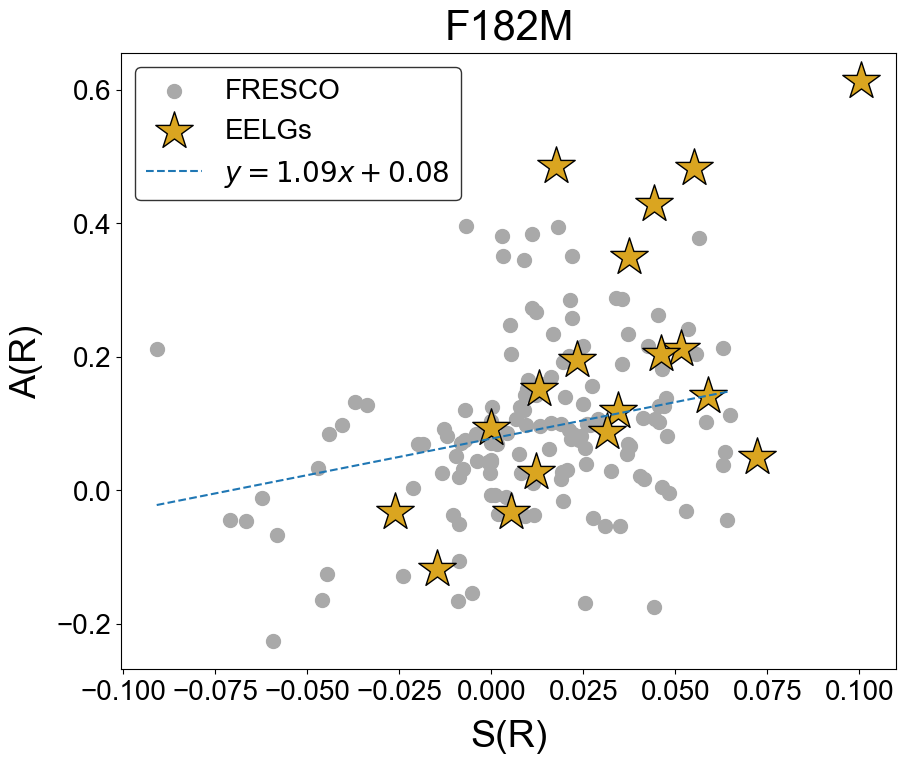

In [22]:
from PIL import Image

# S-A Plot 
# Selecting x and y data from tables for f180 and excluding 12761.0
x_data_c_m_n_180 = c_m_n_new['smoothness_f180']
x_data_c_m_n_180 = x_data_c_m_n_180[c_m_n_new['zfourge_id'] != 12761.0]
y_data_c_m_n_180 = c_m_n_new['asym_f180']
y_data_c_m_n_180 = y_data_c_m_n_180[c_m_n_new['zfourge_id'] != 12761.0]

x_data_e_m_n_180 = e_m_n_new['smoothness_f180']
y_data_e_m_n_180 = e_m_n_new['asym_f180']

# Majority of Data
sorted_indices = np.argsort(x_data_c_m_n_180)
x_sorted_180 = x_data_c_m_n_180.iloc[sorted_indices].reset_index(drop=True)
y_sorted_180 = y_data_c_m_n_180.iloc[sorted_indices].reset_index(drop=True)

# Calculate the number of points to exclude (5% of total)
exclude_points_180 = int(0.05 * len(x_sorted_180))

# Select the range excluding the lowest and highest 5% of data
xseq_180 = x_sorted_180[exclude_points_180:-exclude_points_180]
yseq_180 = y_sorted_180[exclude_points_180:-exclude_points_180]

# Plotting Scatter Plot 
fig_180 = plt.figure(figsize=(10, 8))
plt.scatter(xseq_180, yseq_180, label='FRESCO', s=100, color = 'darkgray')
plt.scatter(x_data_e_m_n_180, y_data_e_m_n_180, label='EELGs', marker='*', s=800, edgecolor='black', color = 'goldenrod')

# Fit a line to the selected data
b, a = np.polyfit(xseq_180, yseq_180, deg=1)

# Generate x values for the line
x_plot_180 = np.linspace(min(xseq_180), max(xseq_180), num=100)

# Plot the line
plt.plot(x_plot_180, a + b * x_plot_180, linestyle='--', label=f'$y = {b:.2f}x {a:+.2f}$')

# Set plot labels and title
plt.xlabel('S(R)', fontsize = 27, labelpad=10, fontname='Arial')
plt.ylabel('A(R)', fontsize = 26, labelpad=10, fontname='Arial')
plt.title('F182M', fontsize = 30, pad=10, fontname='Arial')

# # Showing the Ratio on the Scatter Plot
# plt.text(0.015, 0.03, f'''Merger Fraction
# Non-EELG = {average_merg_ratio_c_m_n_180_boot:.2f} ± {error_std_dev_merg_ratio_c_m_n_180_boot:.2f}\nEELG = {average_merg_ratio_e_m_n_180_boot:.2f} ± {error_std_dev_merg_ratio_e_m_n_180_boot:.2f}''',
#          transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='black', linewidth = 1.5))

# Plot Graph & Legend
plt.legend(edgecolor='black')
plt.show()

# Convert the figure to a NumPy array
fig_180.canvas.draw()
image_array_180 = np.array(fig_180.canvas.renderer.buffer_rgba())
# Convert the NumPy array to a PIL Image
image_180 = Image.fromarray(image_array_180)

# Convert the image to 'RGB' mode
image_180 = image_180.convert('RGB')

# Save PDF
image_180.save(pathout_plots + 'F182M_plot_SA.pdf', dpi=(3000, 3000))

In [114]:
sorted_df = e_m_n_new[['zfourge_id', 'smoothness_f180', 'asym_f180']].sort_values(by='asym_f180', ascending=True)
print(sorted_df)

    zfourge_id  smoothness_f180  asym_f180
0      12552.0        -0.014846  -0.117365
3      22768.0        -0.026050  -0.033108
8      19843.0         0.005290  -0.032404
6      11548.0         0.012014   0.027793
14     22909.0         0.072275   0.049246
18     23511.0         0.031288   0.088099
13     13155.0         0.000000   0.093428
5      10092.0         0.034531   0.119153
16     15111.0         0.058923   0.141635
11     20836.0         0.012954   0.151446
1      12903.0         0.023359   0.195322
7      15097.0         0.046011   0.204923
4       8366.0         0.051443   0.211827
9      19863.0         0.037501   0.349447
10     20257.0         0.044174   0.428701
12     22136.0         0.055170   0.482905
15     12030.0         0.017606   0.485202
2      18742.0         0.100499   0.612405


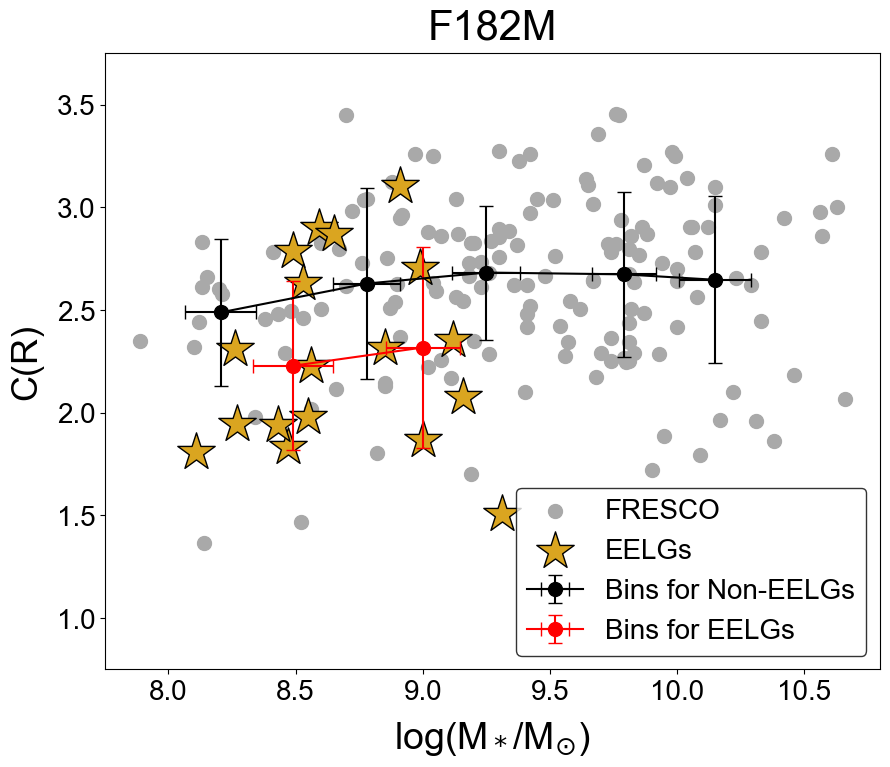

In [12]:
# log(stellar mass) vs Concentration Plot

from PIL import Image

# Selecting x & y data, and excluding 7867.0
x_c_stmass_180 = c_m_n_new['lmass']
real_x_c_stmass_180 = x_c_stmass_180[c_m_n_new['zfourge_id'] != 7867.0]

y_c_conc_180 = c_m_n_new['conc_f180']
real_y_c_conc_180 = y_c_conc_180[c_m_n_new['zfourge_id'] != 7867.0]

x_e_stmass_180 = e_m_n_new['lmass']
y_e_conc_180 = e_m_n_new['conc_f180']

# Plotting the EEL & Control Galaxies
fig_stmass_conc_180 = plt.figure(figsize=(10, 8))
plt.scatter(real_x_c_stmass_180, real_y_c_conc_180, label='FRESCO', s=100, color = 'darkgray')
plt.scatter(x_e_stmass_180, y_e_conc_180, label='EELGs', marker='*', s=800, edgecolor='black', color = 'goldenrod')

# Filter x and y coordinates between 8 and 10.5
x_filtered_c_180 = real_x_c_stmass_180[(real_x_c_stmass_180 >= 8) & (real_x_c_stmass_180 <= 10.5)]
y_filtered_c_180 = real_y_c_conc_180[(real_x_c_stmass_180 >= 8) & (real_x_c_stmass_180 <= 10.5)]

# Define bins for x-axis
bins = np.arange(8, 11, 0.5)

# Calculate median x and y values for each bin
x_medians_180 = []
y_medians_180 = []
x_std_devs_180 = []
y_std_devs_180 = []

# loop iterates over the range of indices from 0 to the length of bins minus 1.
for i in range(len(bins)-1):
#      Filters elements that are greater than or equal to the lower bound of the current bin AND less than the upper bound of the current bin.
    x_bin_c_180 = x_filtered_c_180[(x_filtered_c_180 >= bins[i]) & (x_filtered_c_180 < bins[i+1])]
    y_bin_c_180 = y_filtered_c_180[(x_filtered_c_180 >= bins[i]) & (x_filtered_c_180 < bins[i+1])]
    x_medians_180.append(np.median(x_bin_c_180))
    x_std_devs_180.append(np.std(x_bin_c_180))
    y_medians_180.append(np.median(y_bin_c_180))
    y_std_devs_180.append(np.std(y_bin_c_180))

# Plotting Median Points + Err. Bars
plt.errorbar(x_medians_180, y_medians_180, xerr=x_std_devs_180, yerr=y_std_devs_180, fmt='ko-', label='Bins for Non-EELGs', capsize=5, markersize=10)

# Same Bin Process for EELGs
# Filter x and y coordinates between 8 and 9.5
x_filtered_e_180 = x_e_stmass_180[(x_e_stmass_180 >= 8) & (x_e_stmass_180 <= 9.5)]
y_filtered_e_180 = y_e_conc_180[(x_e_stmass_180 >= 8) & (x_e_stmass_180 <= 9.5)]

# Define bins for x-axis
bins = np.arange(8, 10.25, 0.75)

# Calculate median x and y values for each bin
x_medians_180 = []
y_medians_180 = []
x_std_devs_180 = []
y_std_devs_180 = []

for i in range(len(bins)-1):
    x_bin_e_180 = x_filtered_e_180[(x_filtered_e_180 >= bins[i]) & (x_filtered_e_180 < bins[i+1])]
    y_bin_e_180 = y_filtered_e_180[(x_filtered_e_180 >= bins[i]) & (x_filtered_e_180 < bins[i+1])]
    x_medians_180.append(np.median(x_bin_e_180))
    x_std_devs_180.append(np.std(x_bin_e_180))
    y_medians_180.append(np.median(y_bin_e_180))
    y_std_devs_180.append(np.std(y_bin_e_180))

# Plotting Median Points + Err. Bars EELG
plt.errorbar(x_medians_180, y_medians_180, xerr=x_std_devs_180, yerr=y_std_devs_180, fmt='o-', label='Bins for EELGs', capsize=5, markersize=10, color='red')

# Labelling Axes
plt.xlabel(f'log(M$_*$/M$_{{\odot}}$)', fontsize=27, labelpad=10, fontname='Arial')
plt.ylabel('C(R)', fontsize = 26, labelpad=10, fontname='Arial')
plt.ylim(0.75, 3.75)
plt.title('F182M', fontsize = 30, pad=10, fontname='Arial')

# Plot Graph & legend
plt.legend(edgecolor='black')
plt.show()

# Convert the figure to a NumPy array
fig_stmass_conc_180.canvas.draw()
image_array_180 = np.array(fig_stmass_conc_180.canvas.renderer.buffer_rgba())
# Convert the NumPy array to a PIL Image
image_180 = Image.fromarray(image_array_180)

# Convert the image to 'RGB' mode
image_180 = image_180.convert('RGB')

# Save PDF
image_180.save(pathout_plots + 'F182M_plot_Conc_StMass.pdf', dpi=(3000, 3000))

In [13]:
def merger_rat_n_err(con_data, EELG_data, mean_c_name, sd_c_name, mean_e_name, sd_e_name):
    
    global_vars = globals() # Access global variables dictionary

    # Finding the Merger Ratio 1000 times for Control sample
    ratios_c_m_n_boot = []

    # 1000x Loop
    for _ in range(1000):
    #     Selects 18 points randomly (with repeats)
        random_points_c_m_n = con_data[['m20_f210','gini_f210']].sample(n=len(EELG_data), replace=True)
    #     Merger line with points that match 
        y_merger_cmn_ratio_sample = m_ml*random_points_c_m_n['m20_f210'] + c_ml
    #     Counting points above line
        above_merger_c_m_n_boot = (random_points_c_m_n['gini_f210'].values > y_merger_cmn_ratio_sample).sum()
    #     Findning ratio of above line : total 
        ratio_above_total_c_m_n_boot = above_merger_c_m_n_boot / len(EELG_data)
    #     Creating a long set of all the ratios
        ratios_c_m_n_boot.append(ratio_above_total_c_m_n_boot)

    # Find the mean and SD of the 1000 trials. Print Results. 
    mean_c = np.mean(ratios_c_m_n_boot)
    sd_c = np.std(ratios_c_m_n_boot)
    
    # Assign to global variables
    global_vars[mean_c_name] = mean_c
    global_vars[sd_c_name] = sd_c


    # Repeat for EELGS
    ratios_e_m_n_boot = []

    for _ in range(1000):
        random_points_e_m_n = EELG_data[['m20_f210','gini_f210']].sample(n=len(EELG_data), replace=True)
        y_merger_emn_ratio_sample = m_ml*random_points_e_m_n['m20_f210'] + c_ml
        above_merger_e_m_n_boot = (random_points_e_m_n['gini_f210'].values > y_merger_emn_ratio_sample).sum() 
        ratio_above_total_e_m_n_boot = above_merger_e_m_n_boot / len(EELG_data)
        ratios_e_m_n_boot.append(ratio_above_total_e_m_n_boot)

    mean_e = np.mean(ratios_e_m_n_boot)
    sd_e = np.std(ratios_e_m_n_boot)
    
    # Assign to global variables
    global_vars[mean_e_name] = mean_e
    global_vars[sd_e_name] = sd_e


    return print(f"""Average Control Merger Ratio after 1000 Loops (Bootstrap) for F210: {mean_c}
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F210: {sd_c}

Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F210: {mean_e}
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F210: {sd_e}""")

merger_rat_n_err(c_m_n_new, e_m_n_new, 'average_merg_ratio_c_m_n_boot', 'error_std_dev_merg_ratio_c_m_n_boot', 'average_merg_ratio_e_m_n_boot', 'error_std_dev_merg_ratio_e_m_n_boot')

Average Control Merger Ratio after 1000 Loops (Bootstrap) for F210: 0.3035
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F210: 0.10533062291402623

Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F210: 0.5505
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F210: 0.11892936746003674


In [14]:
merger_rat_n_err(con_new, EELG_new, 'c_mean_mr', 'c_sd_err', 'e_mean_mr', 'e_sd_err')

Average Control Merger Ratio after 1000 Loops (Bootstrap) for F210: 0.267875
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F210: 0.08663219466675064

Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F210: 0.6224166666666667
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F210: 0.10148340723706731


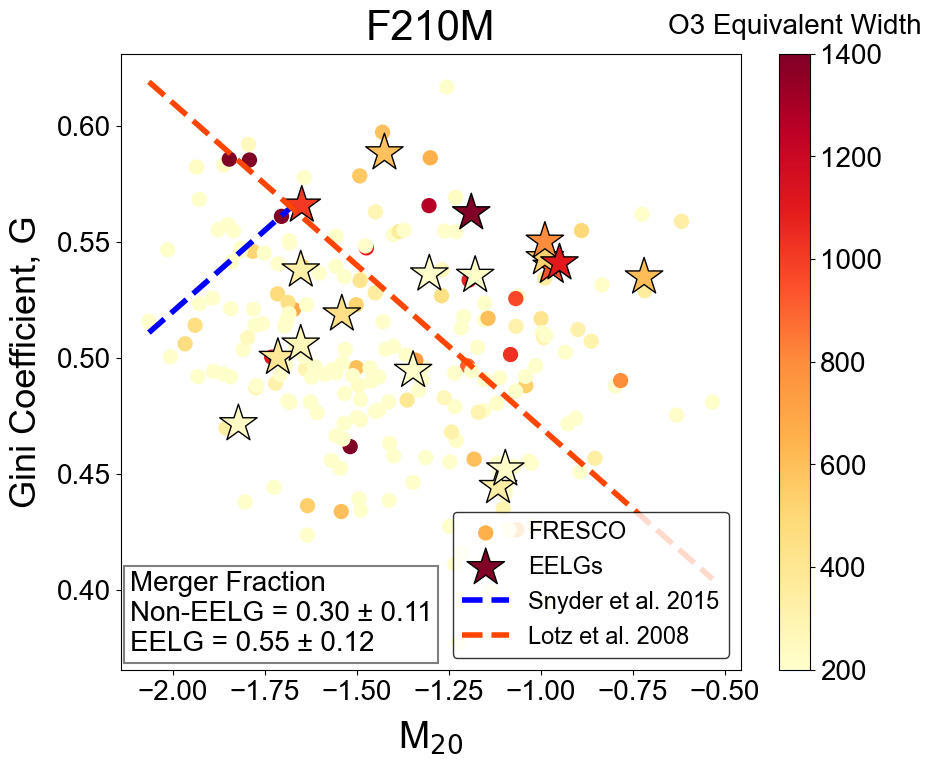

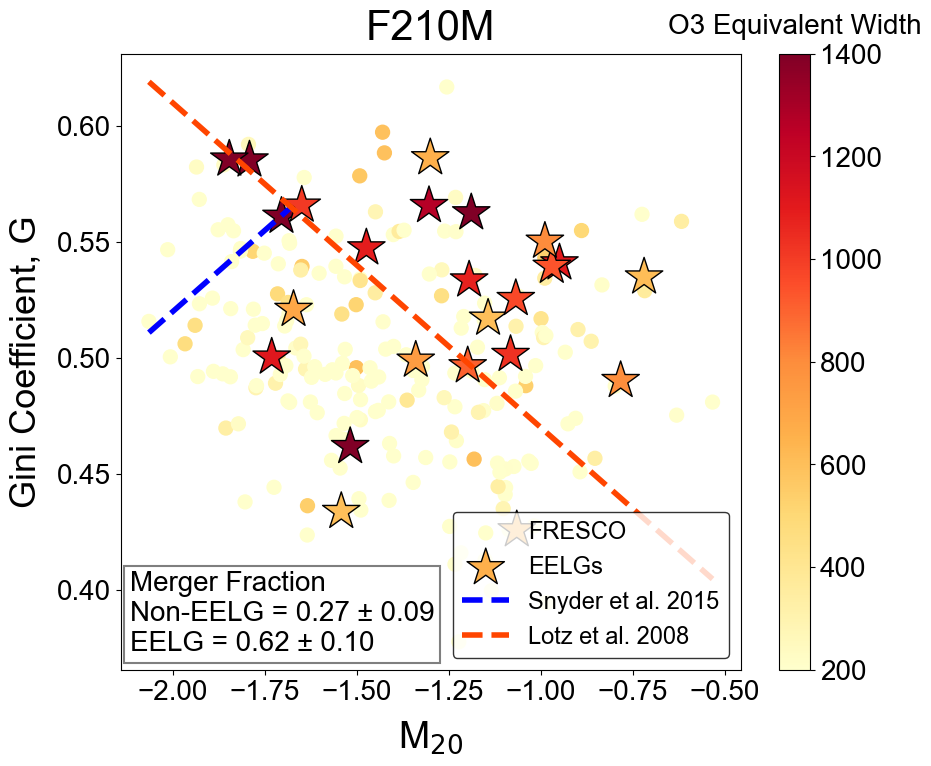

In [15]:

def make_210_plots(con_data, EELG_data, mean_c, sd_c, mean_e, sd_e, name):

    from PIL import Image
    # Selecting x and y data from tables
    x_data_c_m_n = con_data['m20_f210']
    y_data_c_m_n = con_data['gini_f210']

    x_data_e_m_n = EELG_data['m20_f210']
    y_data_e_m_n = EELG_data['gini_f210']

    # X-data for f180. 
    x_data_c_m_n_180 = con_data['m20_f180']

    # Scatter Plot of All Galaxy Data
    fig = plt.figure(figsize=(10, 8))
    plt.scatter(x_data_c_m_n, y_data_c_m_n, label='FRESCO', s=100, cmap='YlOrRd',c=con_data['o3_ew'], vmin=200, vmax=1400)
    plt.scatter(x_data_e_m_n, y_data_e_m_n, label='EELGs', marker='*', s=800, edgecolor='black', cmap='YlOrRd',c=EELG_data['o3_ew'], vmin=200, vmax=1400)

    # Generate x values for merger line
    x_merg_ln = np.linspace(min(c_m_n_new['m20_f210'].min(), e_m_n_new['m20_f210'].min()),
                           max(c_m_n_new['m20_f210'].max(), e_m_n_new['m20_f210'].max()), 100)
    # Calculate corresponding y values for merger line
    y_merg_ln = m_ml * x_merg_ln + c_ml

    # y values for ratio
    y_merger_cmn = m_ml*x_data_c_m_n + c_ml
    y_merger_emn = m_ml*x_data_e_m_n + c_ml

    # y_merger_emn_180 = m_ml*x_data_e_m_n_180 + c_ml

    # # Scatter plot for 'e_m_n' with color coding
    # above_line_mask = e_m_n_new['gini_f180'] > y_merger_emn_180
    # below_line_mask = e_m_n_new['gini_f180'] <= y_merger_emn_180
    # plt.scatter(e_m_n_new.loc[below_line_mask, 'm20_f210'], e_m_n_new.loc[below_line_mask, 'gini_f210'],  label = 'Non-Merger EELG f180', color='darkorange')

    # # Scatter plot for 'e_m_n' merger galaxies
    # plt.scatter(e_m_n_new.loc[above_line_mask, 'm20_f210'], e_m_n_new.loc[above_line_mask, 'gini_f210'], label='Merger EELGs f180', color='magenta')

    # Limits for Elliptcal-Spiral Line Divide (ESLD)
    x_elip_spir = np.linspace(min(c_m_n_new['m20_f210'].min(), e_m_n_new['m20_f210'].min()),
                           max(c_m_n_new['m20_f210'].max(), e_m_n_new['m20_f210'].max()), 100)

    # Restrict x_values to have a maximum value of -1.68
    x_elip_spir = np.clip(x_elip_spir, x_elip_spir.min(), -1.678571429)

    # ESLD Equation and Plotting
    y_elip_spir = m_es * x_elip_spir + c_es
    plt.plot(x_elip_spir, y_elip_spir, label='Snyder et al. 2015', color='blue', linestyle='dashed', linewidth=4)

    # Plot the line
    plt.plot(x_merg_ln, y_merg_ln, label='Lotz et al. 2008', color='orangered', linestyle='dashed', linewidth=4)

    # Set plot labels and title
    plt.xlabel(f'M$_{{20}}$', fontsize = 27, labelpad=10, fontname='Arial')
    plt.ylabel('Gini Coefficient, G', fontsize = 26, labelpad=10, fontname='Arial')
    plt.title('F210M', fontsize = 30, pad=10, fontname='Arial')

    # Showing the Ratio on the Scatter Plot 
    plt.text(0.015, 0.03, f'Merger Fraction\nNon-EELG = {mean_c:.2f} ± {sd_c:.2f}\nEELG = {mean_e:.2f} ± {sd_e:.2f}',
             transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='black', linewidth = 1.5))

    plt.legend(edgecolor='black', loc = 'lower right', fontsize=17)

    # Colour Bar
    cbar = plt.colorbar() 
    cbar.set_label('O3 Equivalent Width', fontname='Arial', fontsize = 20, rotation=0)
    # Sets the location of the colour bar label
    cbar.ax.yaxis.set_label_coords(0.5, 1.065)

    plt.show()

    # Saving Image
    # Convert the figure to a NumPy array
    fig.canvas.draw()
    image_array = np.array(fig.canvas.renderer.buffer_rgba())
    # Convert the NumPy array to a PIL Image
    image = Image.fromarray(image_array)

    # Convert the image to 'RGB' mode
    image = image.convert('RGB')

    image.save(pathout_plots + f'F210M_plot_{name}.png', dpi=(3000, 3000))
    
make_210_plots(c_m_n_new, e_m_n_new, average_merg_ratio_c_m_n_boot, error_std_dev_merg_ratio_c_m_n_boot, average_merg_ratio_e_m_n_boot, error_std_dev_merg_ratio_e_m_n_boot, 'old')
make_210_plots(con_new, EELG_new, c_mean_mr, c_sd_err, e_mean_mr, e_sd_err, 'new')

In [16]:
# Finding the Merger Ratio 1000 times for Control sample

copy_for_sd = c_m_n_new.copy()

# Value to exclude
exclude_sd = copy_for_sd[c_m_n_new['zfourge_id'] != 12761.0]

# Select Asym Colum to find Standard Deviation (S.D.)
c_m_n_new_sd = exclude_sd[['asym_f210']]
e_m_n_new_sd = e_m_n_new.copy()[['asym_f210']]

# Append the DataFrames for S.D.
all_results_asym = pd.concat([c_m_n_new_sd, e_m_n_new_sd], ignore_index=True)

# Find S.D. of combined Galaxy Data
sigma = np.std(all_results_asym).item()

ratios_c_AS_boot = []

# 1000x Loop
for _ in range(1000):
#      Selects 18 points randomly (with repeats)    
    random_points_c_m_n = exclude_sd[['smoothness_f210', 'asym_f210']].sample(n=18, replace=True)
#     Finding Expected Asym Value based on Control Linear Regression
    asym_exp_c = 1.38*random_points_c_m_n['smoothness_f210']  + 0.12
#     Finding the difference of Actual Asym from Expected    
    y_data_c_m_n_merg_AS = (random_points_c_m_n['asym_f210'] - asym_exp_c)/sigma    
#     Counting points above line    
    above_merger_c_m_n_boot = (y_data_c_m_n_merg_AS > 2.5*sigma).sum()
#     Findning ratio of above line : total     
    ratio_above_total_c_m_n_boot = above_merger_c_m_n_boot / 18
#     Creating a long set of all the ratios    
    ratios_c_AS_boot.append(ratio_above_total_c_m_n_boot)

# Find the mean and SD (error) of the 1000 trials. Print Results. 
average_merg_ratio_c_m_n_boot = np.mean(ratios_c_AS_boot)
error_std_dev_merg_ratio_c_m_n_boot = np.std(ratios_c_AS_boot)
print(f"Average Control Merger Ratio after 1000 Loops (Bootstrap) for F210: {average_merg_ratio_c_m_n_boot}")
print(f"""Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F210: {error_std_dev_merg_ratio_c_m_n_boot}
""")

# Repeat for EELGS
ratios_e_AS_boot = []

for _ in range(1000):
    random_points_e_m_n = e_m_n_new[['smoothness_f210','asym_f210']].sample(n=18, replace=True)
    asym_exp_e = 1.38*random_points_e_m_n['smoothness_f210'] + 0.12
    y_data_e_m_n_merg_AS = (random_points_e_m_n['asym_f210'] - asym_exp_e)/sigma
    above_merger_e_m_n_boot = (y_data_e_m_n_merg_AS.values > 2.5*sigma).sum()
    ratio_above_total_e_m_n_boot = above_merger_e_m_n_boot / 18
    ratios_e_AS_boot.append(ratio_above_total_e_m_n_boot)

average_merg_ratio_e_m_n_boot = np.mean(ratios_e_AS_boot)
error_std_dev_merg_ratio_e_m_n_boot = np.std(ratios_e_AS_boot)
print(f"Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F210: {average_merg_ratio_e_m_n_boot}")
print(f"Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F210: {error_std_dev_merg_ratio_e_m_n_boot}")

Average Control Merger Ratio after 1000 Loops (Bootstrap) for F210: 0.23038888888888887
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for F210: 0.09915368729252436

Average EELG Merger Ratio after 1000 Loops (Bootstrap) for F210: 0.3302777777777778
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for F210: 0.1133928901248407


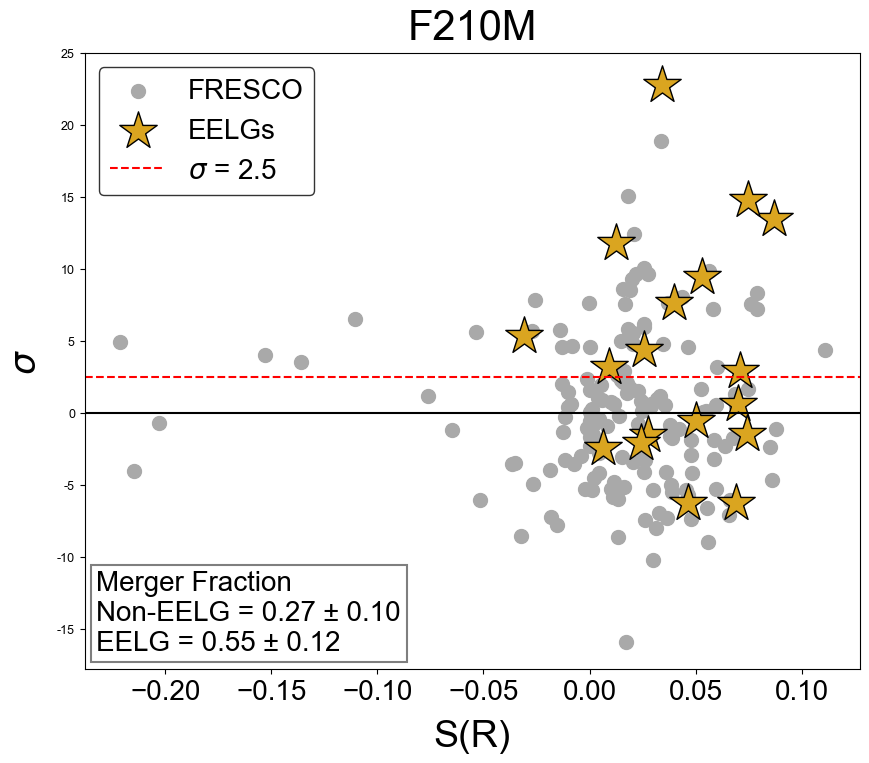

In [27]:
from PIL import Image

# Selecting x and y data from tables for f210 but exlcuding 12761.0

x_data_c_m_n = c_m_n_new['smoothness_f210']
x_data_c_m_n = x_data_c_m_n[c_m_n_new['zfourge_id'] != 12761.0]
y_excl_outl = c_m_n_new['asym_f210']

x_data_e_m_n = e_m_n_new['smoothness_f210']

# Expected Asymmetry from LBF
asym_exp_c = 1.38*x_data_c_m_n + 0.12
# Real Asym Difference in S.D. from Expected
y_data_c_m_n = (y_excl_outl[c_m_n_new['zfourge_id'] != 12761.0] - asym_exp_c)/sigma

# Repeat for EELG (Asym-Sigma)
asym_exp_e = 1.38*e_m_n_new['smoothness_f210'] + 0.12
y_data_e_m_n = (e_m_n_new['asym_f210'] - asym_exp_e)/sigma

# Plotting Scatter Plot 
fig = plt.figure(figsize=(10, 8))
plt.scatter(x_data_c_m_n, y_data_c_m_n, label='FRESCO', s=100, color = 'darkgray')
plt.scatter(x_data_e_m_n, y_data_e_m_n, label='EELGs', marker='*', s=800, edgecolor='black', color = 'goldenrod')

# Set y-axis ticks and labels in sigma units
sigma_ticks = np.arange(-15, 30, 5)  # Adjust range as needed
plt.yticks(sigma_ticks * sigma, labels=[tick for tick in sigma_ticks], fontsize=9)

# Plotting Line y = 2.5*sig
plt.axhline(y=2.5*sigma, color='r', linestyle='--', label=f'$\sigma$ = 2.5')
# X-Axis
plt.axhline(y=0, color='black')

# # Count data points above and below the line for each DataFrame
# above_merger_c_m_n = (y_data_c_m_n > 3*sigma).sum()

# above_merger_e_m_n = (y_data_e_m_n > 3*sigma).sum()

# # Ratios of Control and EELGs Above Merger Line To Total for f210
# ratio_above_below_c_m_n = above_merger_c_m_n / len(y_data_c_m_n)
# ratio_above_below_e_m_n = above_merger_e_m_n / len(y_data_e_m_n)

# Set plot labels and title
plt.xlabel(f'S(R)', fontsize = 27, labelpad=10, fontname='Arial')
plt.ylabel(f'$\sigma$', fontsize = 26, labelpad=10, fontname='Arial')
plt.title('F210M', fontsize = 30, pad=10, fontname='Arial')

# Showing the Ratio on the Scatter Plot
plt.text(0.015, 0.03, f'''Merger Fraction
Non-EELG = {average_merg_ratio_c_m_n_boot:.2f} ± {error_std_dev_merg_ratio_c_m_n_boot:.2f}\nEELG = {average_merg_ratio_e_m_n_boot:.2f} ± {error_std_dev_merg_ratio_e_m_n_boot:.2f}''',
         transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='black', linewidth = 1.5))

# PLot Graph & Legend
plt.legend(edgecolor='black')
plt.show()

# Convert the figure to a NumPy array
fig.canvas.draw()
image_array = np.array(fig.canvas.renderer.buffer_rgba())
# Convert the NumPy array to a PIL Image
image = Image.fromarray(image_array)

# Convert the image to 'RGB' mode
image = image.convert('RGB')

# Save Image 
image.save(pathout_plots + 'F210M_plot_AS_Sig.pdf', dpi=(3000, 3000))

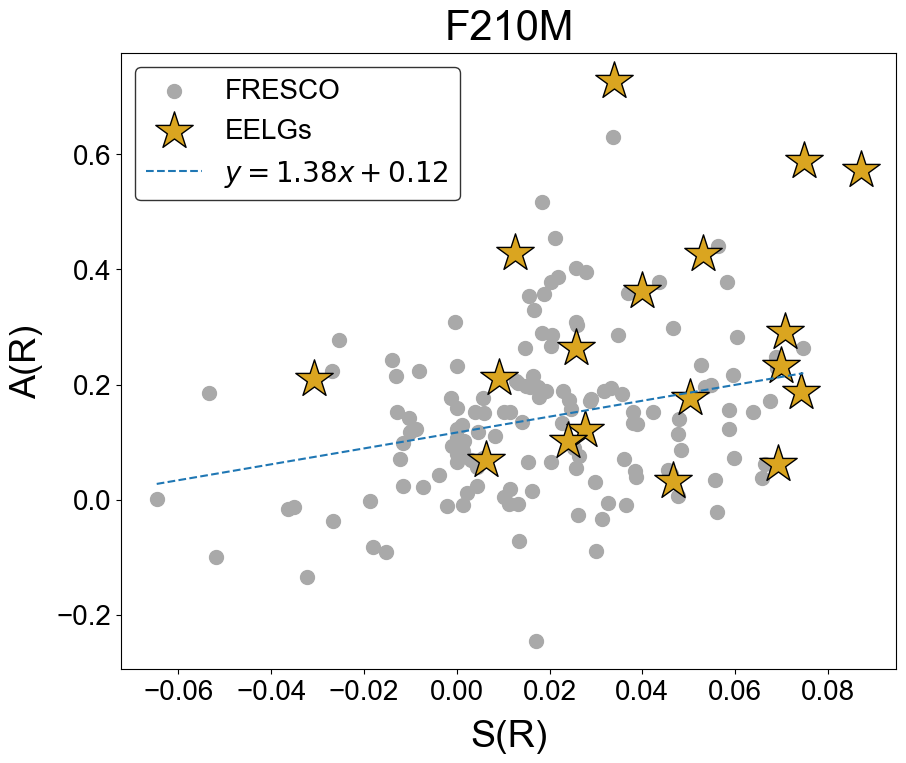

In [28]:
from PIL import Image

# S-A Plot 
# Selecting x and y data from tables for f210 but excluding 12761.0
x_data_c_m_n = c_m_n_new['smoothness_f210']
x_data_c_m_n = x_data_c_m_n[c_m_n_new['zfourge_id'] != 12761.0]
y_data_c_m_n = c_m_n_new['asym_f210']
y_data_c_m_n = y_data_c_m_n[c_m_n_new['zfourge_id'] != 12761.0]

x_data_e_m_n = e_m_n_new['smoothness_f210']
y_data_e_m_n = e_m_n_new['asym_f210']

# Majority of Data
sorted_indices = np.argsort(x_data_c_m_n)
x_sorted = x_data_c_m_n.iloc[sorted_indices].reset_index(drop=True)
y_sorted = y_data_c_m_n.iloc[sorted_indices].reset_index(drop=True)

# Calculate the number of points to exclude (5% of total)
exclude_points = int(0.05 * len(x_sorted))

# Select the range excluding the lowest and highest 5% of data
xseq = x_sorted[exclude_points:-exclude_points]
yseq = y_sorted[exclude_points:-exclude_points]

# Plotting Scatter Plot 
fig = plt.figure(figsize=(10, 8))
plt.scatter(xseq, yseq, label='FRESCO', s=100, color = 'darkgray')
plt.scatter(x_data_e_m_n, y_data_e_m_n, label='EELGs', marker='*', s=800, edgecolor='black', color = 'goldenrod')

# Fit a line to the selected data
b, a = np.polyfit(xseq, yseq, deg=1)

# Generate x values for the line
x_plot = np.linspace(min(xseq), max(xseq), num=100)

# Plot the line
plt.plot(x_plot, a + b * x_plot, linestyle='--', label=f'$y = {b:.2f}x {a:+.2f}$')

# Set plot labels and title
plt.xlabel('S(R)', fontsize = 27, labelpad=10, fontname='Arial')
plt.ylabel('A(R)', fontsize = 26, labelpad=10, fontname='Arial')
plt.title('F210M', fontsize = 30, pad=10, fontname='Arial')

# # Showing the Ratio on the Scatter Plot
# plt.text(0.015, 0.03, f'''Merger Fraction
# Non-EELG = {average_merg_ratio_c_m_n_boot:.2f} ± {error_std_dev_merg_ratio_c_m_n_boot:.2f}\nEELG = {average_merg_ratio_e_m_n_boot:.2f} ± {error_std_dev_merg_ratio_e_m_n_boot:.2f}''',
#          transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='black', linewidth = 1.5))

# Plot Graph & Legend
plt.legend(edgecolor='black')
plt.show()

# Convert the figure to a NumPy array
fig.canvas.draw()
image_array = np.array(fig.canvas.renderer.buffer_rgba())
# Convert the NumPy array to a PIL Image
image = Image.fromarray(image_array)

# Convert the image to 'RGB' mode
image = image.convert('RGB')

# Save Image
image.save(pathout_plots + 'F210M_plot_SA.pdf', dpi=(3000, 3000))

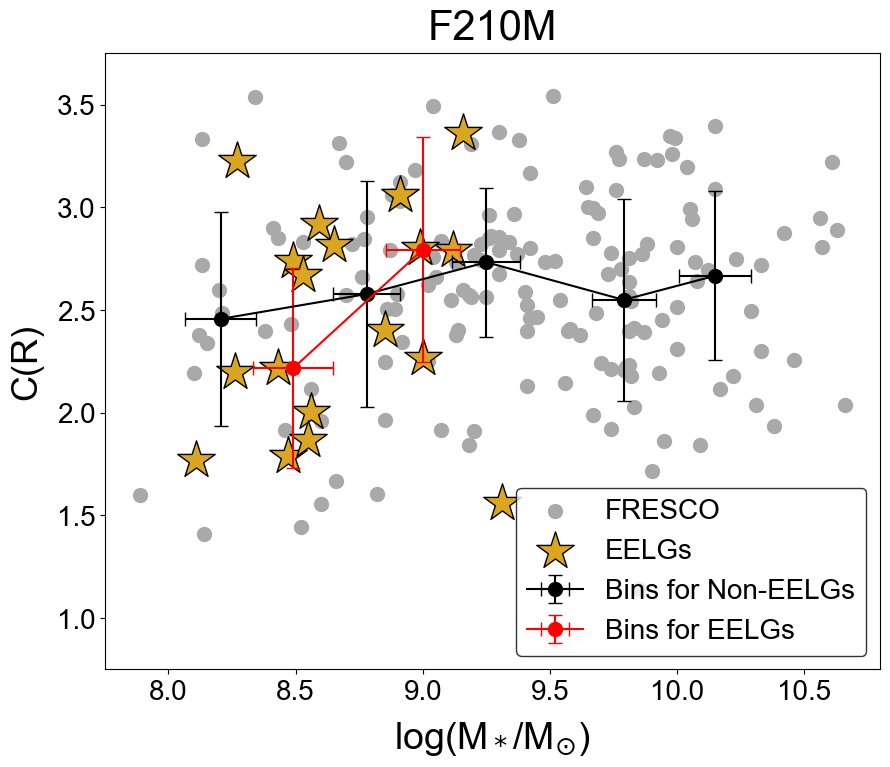

In [59]:
from PIL import Image

# Selecting x and y data from tables for f210 but excluding 7867.0
x_c_stmass = c_m_n_new['lmass']
real_x_c_stmass = x_c_stmass[c_m_n_new['zfourge_id'] != 7867.0]

y_c_conc = c_m_n_new['conc_f210']
real_y_c_conc = y_c_conc[c_m_n_new['zfourge_id'] != 7867.0]

x_e_stmass = e_m_n_new['lmass']
y_e_conc = e_m_n_new['conc_f210']

# Scatter Plots
fig_stmass_conc = plt.figure(figsize=(10, 8))
plt.scatter(real_x_c_stmass, real_y_c_conc, label='FRESCO', s=100, color = 'darkgray')
plt.scatter(x_e_stmass, y_e_conc, label='EELGs', marker='*', s=800, edgecolor='black', color = 'goldenrod')

# Filter x and y coordinates between 8 and 10.5
x_filtered_c = real_x_c_stmass[(real_x_c_stmass >= 8) & (real_x_c_stmass <= 10.5)]
y_filtered_c = real_y_c_conc[(real_x_c_stmass >= 8) & (real_x_c_stmass <= 10.5)]

# Define bins for x-axis
bins = np.arange(8, 11, 0.5)

# Calculate median x and y values for each bin
x_medians = []
y_medians = []
x_std_devs = []
y_std_devs = []

# loop iterates over the range of indices from 0 to the length of bins minus 1.
for i in range(len(bins)-1):
#      Filters elements that are greater than or equal to the lower bound of the current bin AND less than the upper bound of the current bin.
    x_bin_c = x_filtered_c[(x_filtered_c >= bins[i]) & (x_filtered_c < bins[i+1])]
    y_bin_c = y_filtered_c[(x_filtered_c >= bins[i]) & (x_filtered_c < bins[i+1])]
    x_medians.append(np.median(x_bin_c))
    x_std_devs.append(np.std(x_bin_c))
    y_medians.append(np.median(y_bin_c))
    y_std_devs.append(np.std(y_bin_c))

# Plotting Median Points + Err. Bars
plt.errorbar(x_medians, y_medians, xerr=x_std_devs, yerr=y_std_devs, fmt='ko-', label='Bins for Non-EELGs', capsize=5, markersize=10)

# Same Bin Process for EELGs
# Filter x and y coordinates between 8 and 9.5
x_filtered_e = x_e_stmass[(x_e_stmass >= 8) & (x_e_stmass <= 9.5)]
y_filtered_e = y_e_conc[(x_e_stmass >= 8) & (x_e_stmass <= 9.5)]

# Define bins for x-axis
bins = np.arange(8, 10.25, 0.75)

# Calculate median x and y values for each bin
x_medians = []
y_medians = []
x_std_devs = []
y_std_devs = []

for i in range(len(bins)-1):
    x_bin_e = x_filtered_e[(x_filtered_e >= bins[i]) & (x_filtered_e < bins[i+1])]
    y_bin_e = y_filtered_e[(x_filtered_e >= bins[i]) & (x_filtered_e < bins[i+1])]
    x_medians.append(np.median(x_bin_e))
    x_std_devs.append(np.std(x_bin_e))
    y_medians.append(np.median(y_bin_e))
    y_std_devs.append(np.std(y_bin_e))

# Plotting Median Points + Err. Bars EELG
plt.errorbar(x_medians, y_medians, xerr=x_std_devs, yerr=y_std_devs, fmt='o-', label='Bins for EELGs', capsize=5, markersize=10, color='red')

plt.xlabel(f'log(M$_*$/M$_{{\odot}}$)', fontsize=27, labelpad=10, fontname='Arial')
plt.ylabel('C(R)', fontsize = 26, labelpad=10, fontname='Arial')
plt.ylim(0.75, 3.75)
plt.title('F210M', fontsize = 30, pad=10, fontname='Arial')

plt.legend(edgecolor='black')
plt.show()

# Convert the figure to a NumPy array
fig_stmass_conc.canvas.draw()
image_array = np.array(fig_stmass_conc.canvas.renderer.buffer_rgba())
# Convert the NumPy array to a PIL Image
image = Image.fromarray(image_array)

# Convert the image to 'RGB' mode
image = image.convert('RGB')

# Save Image
image.save(pathout_plots + 'F210M_plot_Conc_StMass.pdf', dpi=(3000, 3000))

In [16]:
def merger_rat_n_err_o3(con_data, EELG_data, mean_c_name, sd_c_name, mean_e_name, sd_e_name):

    global_vars = globals() # Access global variables dictionary
    
    # Finding the Merger Ratio 1000 times for Control sample
    ratios_c_m_n_o3_boot = []

    # 1000x Loop
    for _ in range(1000):
    #      Selects points randomly (with repeats)    
        random_points_c_m_n_o3 = con_data[['m20_o3','gini_o3']].sample(n=len(EELG_data), replace=True)
    #     Merger line with 18 points that match     
        y_merger_cmn_o3_ratio_sample = m_ml*random_points_c_m_n_o3['m20_o3'] + c_ml
    #     Counting points above line    
        above_merger_c_m_n_o3_boot = (random_points_c_m_n_o3['gini_o3'].values > y_merger_cmn_o3_ratio_sample).sum()
    #     Findning ratio of above line : total     
        ratio_above_below_c_m_n_o3_boot = above_merger_c_m_n_o3_boot / len(EELG_data)
    #     Creating a long set of all the ratios    
        ratios_c_m_n_o3_boot.append(ratio_above_below_c_m_n_o3_boot)

    # Find the mean and SD of the 1000 trials. Print Results. 
    mean_c = np.mean(ratios_c_m_n_o3_boot)
    sd_c = np.std(ratios_c_m_n_o3_boot)
    
    # Assign to global variables
    global_vars[mean_c_name] = mean_c
    global_vars[sd_c_name] = sd_c


    # Repeat for EELGS
    ratios_e_m_n_o3_boot = []

    for _ in range(1000):
        random_points_e_m_n_o3 = EELG_data[['m20_o3','gini_o3']].sample(n=len(EELG_data), replace=True)
        y_merger_emn_o3_ratio_sample = m_ml*random_points_e_m_n_o3['m20_o3'] + c_ml
        above_merger_e_m_n_o3_boot = (random_points_e_m_n_o3['gini_o3'].values > y_merger_emn_o3_ratio_sample).sum() 
        ratio_above_below_e_m_n_o3_boot = above_merger_e_m_n_o3_boot / len(EELG_data)
        ratios_e_m_n_o3_boot.append(ratio_above_below_e_m_n_o3_boot)

    mean_e = np.mean(ratios_e_m_n_o3_boot)
    sd_e = np.std(ratios_e_m_n_o3_boot)
    
    # Assign to global variables
    global_vars[mean_e_name] = mean_e
    global_vars[sd_e_name] = sd_e
    
    return print(f"""Average Control Merger Ratio after 1000 Loops (Bootstrap) for O3: {mean_c}
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for O3: {sd_c}

Average EELG Merger Ratio after 1000 Loops (Bootstrap) for O3: {mean_e}
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for O3: {sd_e}""")

merger_rat_n_err_o3(c_m_n_new, e_m_n_new, 'average_merg_ratio_c_m_n_o3_boot', 'error_std_dev_merg_ratio_c_m_n_o3_boot', 'average_merg_ratio_e_m_n_o3_boot', 'error_std_dev_merg_ratio_e_m_n_o3_boot')


Average Control Merger Ratio after 1000 Loops (Bootstrap) for O3: 0.31761111111111107
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for O3: 0.10600650748718038

Average EELG Merger Ratio after 1000 Loops (Bootstrap) for O3: 0.5597222222222221
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for O3: 0.11583533171737402


In [17]:
merger_rat_n_err_o3(con_new, EELG_new, 'c_mean_mr_o3', 'c_sd_err_o3', 'e_mean_mr_o3', 'e_sd_err_o3')

Average Control Merger Ratio after 1000 Loops (Bootstrap) for O3: 0.2718333333333333
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for O3: 0.09057516829192817

Average EELG Merger Ratio after 1000 Loops (Bootstrap) for O3: 0.6257083333333333
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for O3: 0.10230597320185061


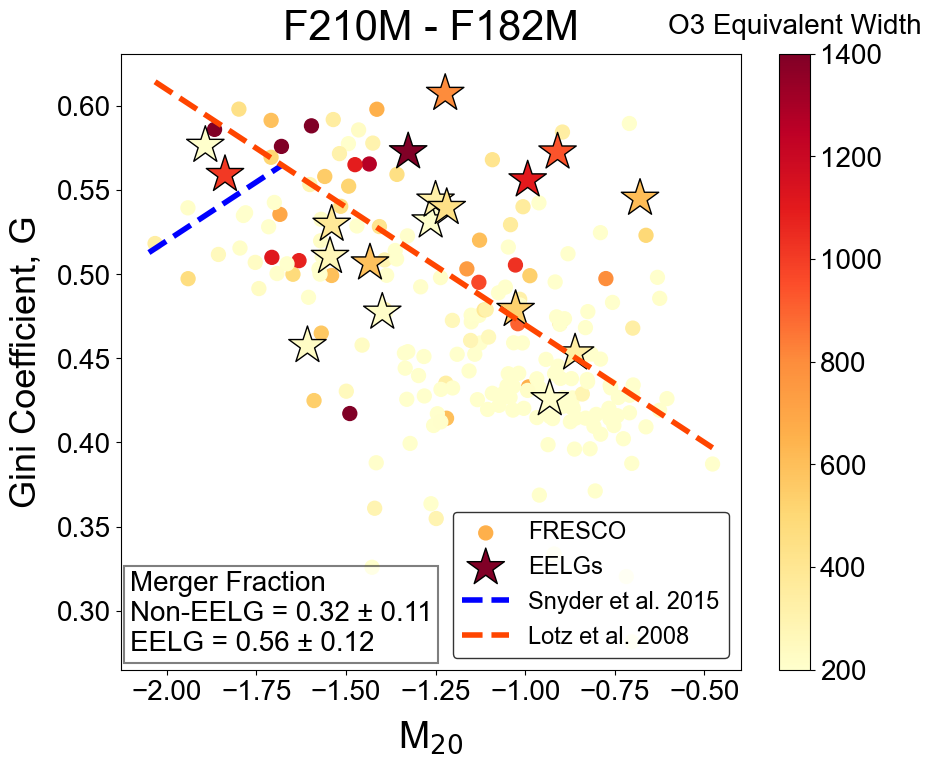

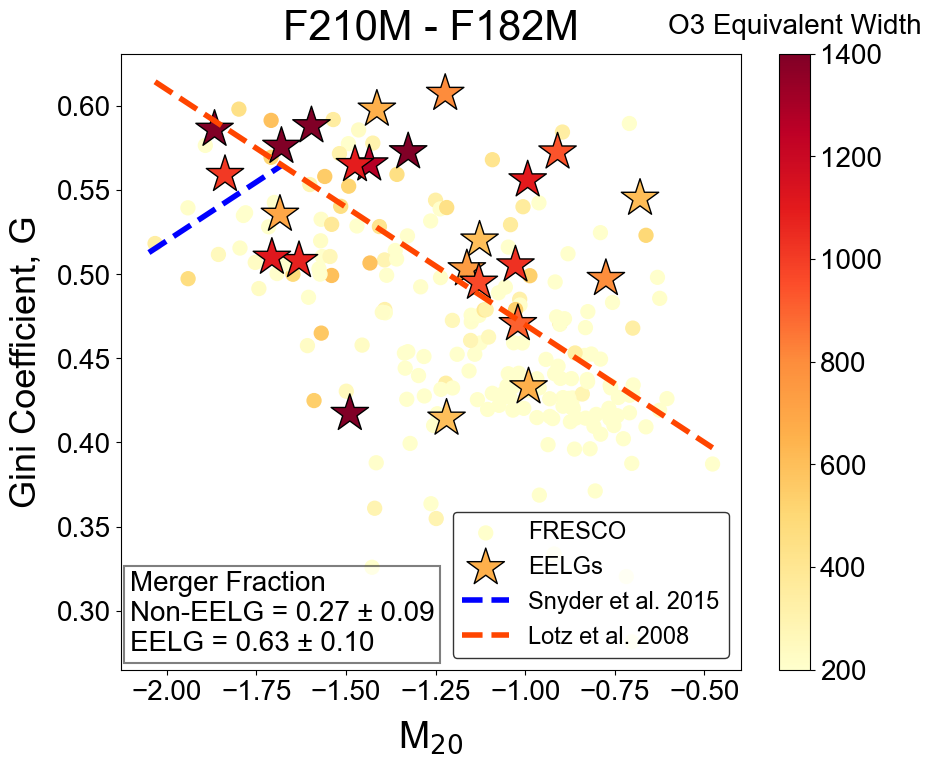

In [18]:
from PIL import Image

def make_o3_plots(con_data, EELG_data, mean_c, sd_c, mean_e, sd_e, name):

    # Selecting x and y data from tables for o3
    x_data_c_m_n_o3 = con_data['m20_o3']
    y_data_c_m_n_o3 = con_data['gini_o3']

    x_data_e_m_n_o3 = EELG_data['m20_o3']
    y_data_e_m_n_o3 = EELG_data['gini_o3']

    # Plotting Scatter Plot 
    fig_o3 = plt.figure(figsize=(10, 8))
    plt.scatter(x_data_c_m_n_o3, y_data_c_m_n_o3, label='FRESCO', s=100, cmap='YlOrRd',c=con_data['o3_ew'], vmin=200, vmax=1400)
    plt.scatter(x_data_e_m_n_o3, y_data_e_m_n_o3, label='EELGs', marker='*', s=800, edgecolor='black', cmap='YlOrRd',c=EELG_data['o3_ew'], vmin=200, vmax=1400)

    # y values for ratio
    y_merger_cmn_o3 = m_ml*x_data_c_m_n_o3 + c_ml
    y_merger_emn_o3 = m_ml*x_data_e_m_n_o3 + c_ml

    # # Scatter plot for 'e_m_n' with color coding
    # above_line_mask = e_m_n_new['gini_f180'] > y_merger_emn_180
    # below_line_mask = e_m_n_new['gini_f180'] <= y_merger_emn_180
    # plt.scatter(e_m_n_new.loc[below_line_mask, 'm20_o3'], e_m_n_new.loc[below_line_mask, 'gini_o3'],  label = 'Non-Merger EELG f180', color='darkorange')

    # # Scatter plot for 'e_m_n' merger galaxies
    # plt.scatter(e_m_n_new.loc[above_line_mask, 'm20_o3'], e_m_n_new.loc[above_line_mask, 'gini_o3'], label='Merger EELGs f180', color='magenta')

    # Restricting the ESLD 
    x_elip_spir_o3 = np.linspace(-2.05, -1.678571429, 100)

    # ESLD Equation and Plotting
    y_elip_spir_o3 = m_es * x_elip_spir_o3 + c_es
    plt.plot(x_elip_spir_o3, y_elip_spir_o3, label='Snyder et al. 2015', color='blue', linestyle='dashed', linewidth=4)

    # Plot the Merger Divide line
    x_merg_ln_o3 = np.linspace(min(c_m_n_new['m20_o3'].min(), e_m_n_new['m20_o3'].min()),
                           max(c_m_n_new['m20_o3'].max(), e_m_n_new['m20_o3'].max()), 100)
    y_merg_ln_o3 = m_ml * x_merg_ln_o3 + c_ml

    plt.plot(x_merg_ln_o3, y_merg_ln_o3, label='Lotz et al. 2008', color='orangered', linestyle='dashed', linewidth=4)

    # Set plot labels and title
    plt.xlabel(f'M$_{{20}}$', fontsize = 27, labelpad=10, fontname='Arial')
    plt.ylabel('Gini Coefficient, G', fontsize = 26, labelpad=10, fontname='Arial')
    plt.title('F210M - F182M', fontsize = 30, pad=10, fontname='Arial')

    # Showing the Ratio on the Scatter Plot
    plt.text(0.015, 0.03, f'Merger Fraction\nNon-EELG = {mean_c:.2f} ± {sd_c:.2f}\nEELG = {mean_e:.2f} ± {sd_e:.2f}',
             transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='black', linewidth = 1.5))

    plt.legend(edgecolor='black', loc='lower right', fontsize=17)

    # Colour Bar
    cbar = plt.colorbar() 
    cbar.set_label('O3 Equivalent Width', fontname='Arial', fontsize = 20, rotation=0)
    # Sets the location of the colour bar label
    cbar.ax.yaxis.set_label_coords(0.5, 1.065)

    plt.show()

    # Convert the figure to a NumPy array
    fig_o3.canvas.draw()
    image_array_o3 = np.array(fig_o3.canvas.renderer.buffer_rgba())
    # Convert the NumPy array to a PIL Image
    image_o3 = Image.fromarray(image_array_o3)

    # Convert the image to 'RGB' mode
    image_o3 = image_o3.convert('RGB')

    # Save Image
    image_o3.save(pathout_plots + f'F210M-F182M_plot_{name}.png', dpi=(3000, 3000))
    
make_o3_plots(c_m_n_new, e_m_n_new, average_merg_ratio_c_m_n_o3_boot, error_std_dev_merg_ratio_c_m_n_o3_boot, average_merg_ratio_e_m_n_o3_boot, error_std_dev_merg_ratio_e_m_n_o3_boot, 'old')
make_o3_plots(con_new, EELG_new, c_mean_mr_o3, c_sd_err_o3, e_mean_mr_o3, e_sd_err_o3, 'new')

In [32]:
# Finding the Merger Ratio 1000 times for Control sample

copy_for_sd_o3 = c_m_n_new.copy()

# Values to exclude
exclude_sd = copy_for_sd_o3[(c_m_n_new['zfourge_id'] != 15401.0) & (c_m_n_new['zfourge_id'] != 7706.0) & (c_m_n_new['zfourge_id'] != 14122.0)]

c_m_n_new_sd = exclude_sd[['asym_o3']]

e_m_n_new_sd = e_m_n_new.copy()[['asym_o3']]

# Append the DataFrames
all_results_asym_o3 = pd.concat([c_m_n_new_sd, e_m_n_new_sd], ignore_index=True)

# Standard Deviation (sigma)
sigma_o3 = np.std(all_results_asym_o3).item()

ratios_c_AS_o3_boot = []

# 1000x Loop
for _ in range(1000):
#      Selects 18 points randomly (with repeats)    
    random_points_c_m_n_o3 = exclude_sd[['smoothness_o3', 'asym_o3']].sample(n=18, replace=True)
    asym_exp_c_o3 = 0.13*random_points_c_m_n_o3['smoothness_o3']  + 0.05
    y_data_c_m_n_merg_AS_o3 = (random_points_c_m_n_o3['asym_o3'] - asym_exp_c_o3)/sigma_o3    
#     Counting points above line    
    above_merger_c_m_n_o3_boot = (y_data_c_m_n_merg_AS_o3 > 2.5*sigma_o3).sum()
#     Findning ratio of above line : total     
    ratio_above_total_c_m_n_o3_boot = above_merger_c_m_n_o3_boot / 18
#     Creating a long set of all the ratios    
    ratios_c_AS_o3_boot.append(ratio_above_total_c_m_n_o3_boot)

# Find the mean and SD of the 1000 trials. Print Results. 
average_merg_ratio_c_m_n_o3_boot = np.mean(ratios_c_AS_o3_boot)
error_std_dev_merg_ratio_c_m_n_o3_boot = np.std(ratios_c_AS_o3_boot)
print(f"Average Control Merger Ratio after 1000 Loops (Bootstrap) for O3: {average_merg_ratio_c_m_n_o3_boot}")
print(f"""Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for O3: {error_std_dev_merg_ratio_c_m_n_o3_boot}
""")

# Repeat for EELGS
ratios_e_AS_o3_boot = []

for _ in range(1000):
    random_points_e_m_n_o3 = e_m_n_new[['smoothness_o3','asym_o3']].sample(n=18, replace=True)
    asym_exp_e_o3 = 0.13*random_points_e_m_n_o3['smoothness_o3'] + 0.05
    y_data_e_m_n_merg_AS_o3 = (random_points_e_m_n_o3['asym_o3'] - asym_exp_e_o3)/sigma_o3
    above_merger_e_m_n_o3_boot = (y_data_e_m_n_merg_AS_o3.values > 2.5*sigma_o3).sum()
    ratio_above_total_e_m_n_o3_boot = above_merger_e_m_n_o3_boot / 18
    ratios_e_AS_o3_boot.append(ratio_above_total_e_m_n_o3_boot)

average_merg_ratio_e_m_n_o3_boot = np.mean(ratios_e_AS_o3_boot)
error_std_dev_merg_ratio_e_m_n_o3_boot = np.std(ratios_e_AS_o3_boot)
print(f"Average EELG Merger Ratio after 1000 Loops (Bootstrap) for O3: {average_merg_ratio_e_m_n_o3_boot}")
print(f"Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for O3: {error_std_dev_merg_ratio_e_m_n_o3_boot}")

Average Control Merger Ratio after 1000 Loops (Bootstrap) for O3: 0.2765
Standard Deviation (error) of Control Merger Ratios after 1000 Loops (Bootstrap) for O3: 0.10485838480635457

Average EELG Merger Ratio after 1000 Loops (Bootstrap) for O3: 0.4483888888888889
Standard Deviation (error) of EELG Merger Ratios after 1000 Loops (Bootstrap) for O3: 0.11740453174419661


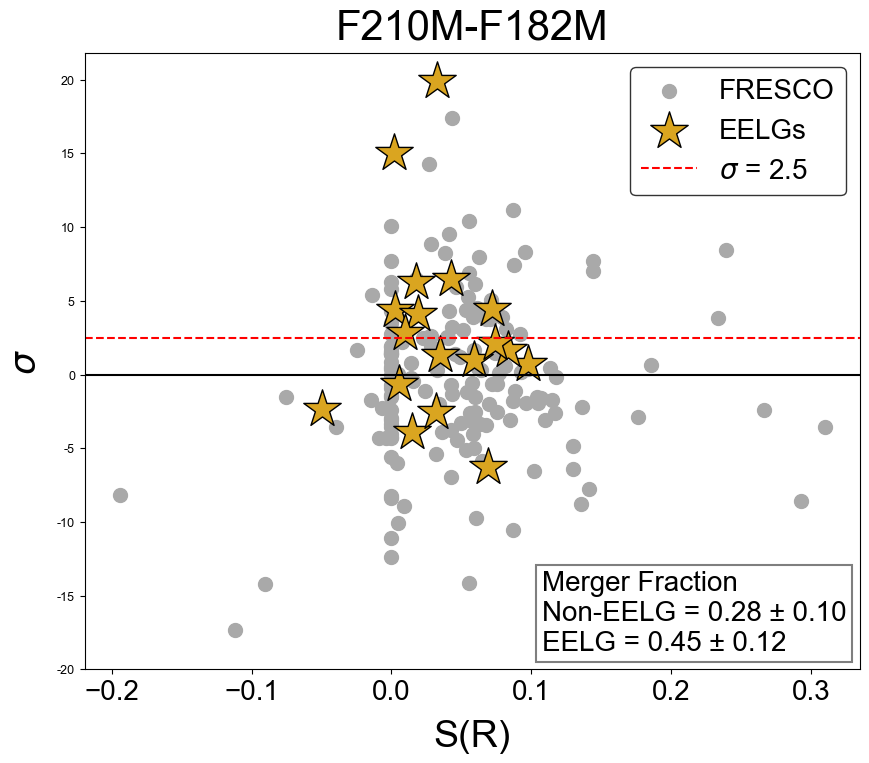

In [33]:
from PIL import Image

# Selecting x and y data from tables for o3

smoothness_o3_values = c_m_n_new['smoothness_o3']
# Values to exclude
x_data_c_m_n_o3 = smoothness_o3_values[(c_m_n_new['zfourge_id'] != 15401.0) & (c_m_n_new['zfourge_id'] != 7706.0) & (c_m_n_new['zfourge_id'] != 14122.0)]

asym_o3_values = c_m_n_new['asym_o3']

# Values to exclude
y_data_c_m_n_o3_excl = asym_o3_values[(c_m_n_new['zfourge_id'] != 15401.0) & (c_m_n_new['zfourge_id'] != 7706.0) & (c_m_n_new['zfourge_id'] != 14122.0)]

x_data_e_m_n_o3 = e_m_n_new['smoothness_o3']

# Finding the Sigm. Deviat. From Expected
asym_exp_c_o3 = 0.13*x_data_c_m_n_o3 + 0.05
y_data_c_m_n_o3 = (y_data_c_m_n_o3_excl - asym_exp_c_o3)/sigma_o3

asym_exp_e_o3 = 0.13*e_m_n_new['smoothness_o3'] + 0.05
y_data_e_m_n_o3 = (e_m_n_new['asym_o3'] - asym_exp_e_o3)/sigma_o3

# Plotting Scatter Plot 
fig_o3 = plt.figure(figsize=(10, 8))
plt.scatter(x_data_c_m_n_o3, y_data_c_m_n_o3, label='FRESCO', s=100, color = 'darkgray')
plt.scatter(x_data_e_m_n_o3, y_data_e_m_n_o3, label='EELGs', marker='*', s=800, edgecolor='black', color = 'goldenrod')

# Set y-axis ticks and labels in sigma units
sigma_ticks = np.arange(-20, 25, 5)  # Adjust range as needed
plt.yticks(sigma_ticks * sigma_o3, labels=[tick for tick in sigma_ticks], fontsize=9)

# Plotting Sigma = 2.5
plt.axhline(y=2.5*sigma_o3, color='r', linestyle='--', label=f'$\sigma$ = 2.5')
# X-Axis
plt.axhline(y=0, color='black')

# # Count data points above and below the line for each DataFrame
# above_merger_c_m_n_o3 = (y_data_c_m_n_o3 > 3*sigma_o3).sum()

# above_merger_e_m_n_o3 = (y_data_e_m_n_o3 > 3*sigma_o3).sum()

# # Ratios of Control and EELGs Above Merger Line To Total for o3
# ratio_above_below_c_m_n_o3 = above_merger_c_m_n_o3 / len(y_data_c_m_n_o3)
# ratio_above_below_e_m_n_o3 = above_merger_e_m_n_o3 / len(y_data_e_m_n_o3)

# Set plot labels and title
plt.xlabel(f'S(R)', fontsize = 27, labelpad=10, fontname='Arial')
plt.ylabel(f'$\sigma$', fontsize = 26, labelpad=10, fontname='Arial')
plt.title('F210M-F182M', fontsize = 30, pad=10, fontname='Arial')

# Showing the Ratio on the Scatter Plot
plt.text(0.59, 0.03, f'''Merger Fraction
Non-EELG = {average_merg_ratio_c_m_n_o3_boot:.2f} ± {error_std_dev_merg_ratio_c_m_n_o3_boot:.2f}\nEELG = {average_merg_ratio_e_m_n_o3_boot:.2f} ± {error_std_dev_merg_ratio_e_m_n_o3_boot:.2f}''',
         transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='black', linewidth = 1.5))

# Plot Graph & legend
plt.legend(edgecolor='black')
plt.show()

# Convert the figure to a NumPy array
fig_o3.canvas.draw()
image_array_o3 = np.array(fig_o3.canvas.renderer.buffer_rgba())
# Convert the NumPy array to a PIL Image
image_o3 = Image.fromarray(image_array_o3)

# Convert the image to 'RGB' mode
image_o3 = image_o3.convert('RGB')

# Save image
image_o3.save(pathout_plots + 'F210M-F182M_plot_AS_Sig.pdf', dpi=(3000, 3000))

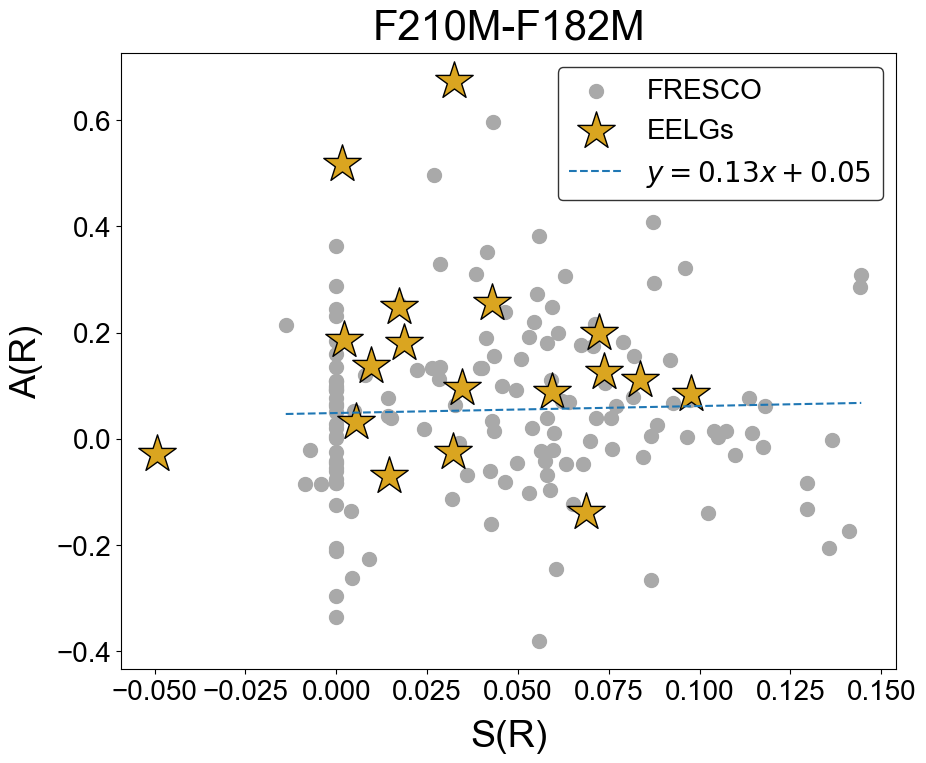

In [34]:
from PIL import Image

# S-A Plot 
# Selecting x and y data from tables for o3

smoothness_o3_values = c_m_n_new['smoothness_o3']
# Values to exclude
x_data_c_m_n_o3 = smoothness_o3_values[(c_m_n_new['zfourge_id'] != 15401.0) & (c_m_n_new['zfourge_id'] != 7706.0) & (c_m_n_new['zfourge_id'] != 14122.0)]

asym_o3_values = c_m_n_new['asym_o3']
# Values to exclude
y_data_c_m_n_o3 = asym_o3_values[(c_m_n_new['zfourge_id'] != 15401.0) & (c_m_n_new['zfourge_id'] != 7706.0) & (c_m_n_new['zfourge_id'] != 14122.0)]

x_data_e_m_n_o3 = e_m_n_new['smoothness_o3']
y_data_e_m_n_o3 = e_m_n_new['asym_o3']

# Majority of Data
sorted_indices = np.argsort(x_data_c_m_n_o3)
x_sorted_o3 = x_data_c_m_n_o3.iloc[sorted_indices].reset_index(drop=True)
y_sorted_o3 = y_data_c_m_n_o3.iloc[sorted_indices].reset_index(drop=True)

# Calculate the number of points to exclude (5% of total)
exclude_points_o3 = int(0.05 * len(x_sorted_o3))

# Select the range excluding the lowest and highest 5% of data
xseq_o3 = x_sorted_o3[exclude_points_o3:-exclude_points_o3]
yseq_o3 = y_sorted_o3[exclude_points_o3:-exclude_points_o3]

# Plotting Scatter Plot 
fig_o3 = plt.figure(figsize=(10, 8))
plt.scatter(xseq_o3, yseq_o3, label='FRESCO', s=100, color = 'darkgray')
plt.scatter(x_data_e_m_n_o3, y_data_e_m_n_o3, label='EELGs', marker='*', s=800, edgecolor='black', color = 'goldenrod')

# Fit a line to the selected data
b, a = np.polyfit(xseq_o3, yseq_o3, deg=1)

# Generate x values for the line
x_plot_o3 = np.linspace(min(xseq_o3), max(xseq_o3), num=100)

# Plot the line
plt.plot(x_plot_o3, a + b * x_plot_o3, linestyle='--', label=f'$y = {b:.2f}x {a:+.2f}$')

# Set plot labels and title
plt.xlabel('S(R)', fontsize = 27, labelpad=10, fontname='Arial')
plt.ylabel('A(R)', fontsize = 26, labelpad=10, fontname='Arial')
plt.title('F210M-F182M', fontsize = 30, pad=10, fontname='Arial')

# # Showing the Ratio on the Scatter Plot
# plt.text(0.015, 0.03, f'''Merger Fraction
# Non-EELG = {average_merg_ratio_c_m_n_o3_boot:.2f} ± {error_std_dev_merg_ratio_c_m_n_o3_boot:.2f}\nEELG = {average_merg_ratio_e_m_n_o3_boot:.2f} ± {error_std_dev_merg_ratio_e_m_n_o3_boot:.2f}''',
#          transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.5, edgecolor='black', linewidth = 1.5))

# Plot Graph & Legend
plt.legend(edgecolor='black')
plt.show()

# Convert the figure to a NumPy array
fig_o3.canvas.draw()
image_array_o3 = np.array(fig_o3.canvas.renderer.buffer_rgba())
# Convert the NumPy array to a PIL Image
image_o3 = Image.fromarray(image_array_o3)

# Convert the image to 'RGB' mode
image_o3 = image_o3.convert('RGB')

# Save Image
image_o3.save(pathout_plots + 'F210M-F182M_plot_SA.pdf', dpi=(3000, 3000))

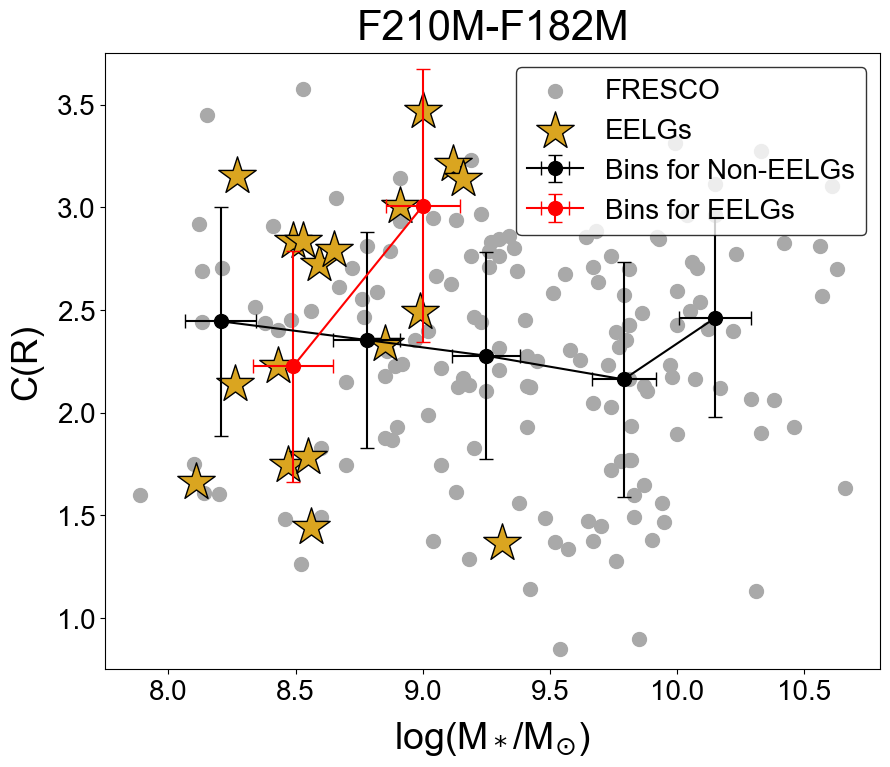

In [11]:
from PIL import Image

# Exclude Value (x & Y)
x_c_stmass_o3 = c_m_n_new['lmass']
real_x_c_stmass_o3 = x_c_stmass_o3[c_m_n_new['zfourge_id'] != 7867.0]

y_c_conc_o3 = c_m_n_new['conc_o3']
real_y_c_conc_o3 = y_c_conc_o3[c_m_n_new['zfourge_id'] != 7867.0]

x_e_stmass_o3 = e_m_n_new['lmass']
y_e_conc_o3 = e_m_n_new['conc_o3']

# Graph Scatter Plots
fig_stmass_conc_o3 = plt.figure(figsize=(10, 8))
plt.scatter(real_x_c_stmass_o3, real_y_c_conc_o3, label='FRESCO', s=100, color = 'darkgray')
plt.scatter(x_e_stmass_o3, y_e_conc_o3, label='EELGs', marker='*', s=800, edgecolor='black', color = 'goldenrod')

# Filter x and y coordinates between 8 and 10.5
x_filtered_c_o3 = real_x_c_stmass_o3[(real_x_c_stmass_o3 >= 8) & (real_x_c_stmass_o3 <= 10.5)]
y_filtered_c_o3 = real_y_c_conc_o3[(real_x_c_stmass_o3 >= 8) & (real_x_c_stmass_o3 <= 10.5)]

# Define bins for x-axis
bins = np.arange(8, 11, 0.5)

# Calculate median x and y values for each bin
x_medians_o3 = []
y_medians_o3 = []
x_std_devs_o3 = []
y_std_devs_o3 = []

# loop iterates over the range of indices from 0 to the length of bins minus 1.
for i in range(len(bins)-1):
#      Filters elements that are greater than or equal to the lower bound of the current bin AND less than the upper bound of the current bin.
    x_bin_c_o3 = x_filtered_c_o3[(x_filtered_c_o3 >= bins[i]) & (x_filtered_c_o3 < bins[i+1])]
    y_bin_c_o3 = y_filtered_c_o3[(x_filtered_c_o3 >= bins[i]) & (x_filtered_c_o3 < bins[i+1])]
    x_medians_o3.append(np.median(x_bin_c_o3))
    x_std_devs_o3.append(np.std(x_bin_c_o3))
    y_medians_o3.append(np.median(y_bin_c_o3))
    y_std_devs_o3.append(np.std(y_bin_c_o3))

# Plotting Median Points + Err. Bars
plt.errorbar(x_medians_o3, y_medians_o3, xerr=x_std_devs_o3, yerr=y_std_devs_o3, fmt='ko-', label='Bins for Non-EELGs', capsize=5, markersize=10)

# Same Bin Process for EELGs
# Filter x and y coordinates between 8 and 9.5
x_filtered_e_o3 = x_e_stmass_o3[(x_e_stmass_o3 >= 8) & (x_e_stmass_o3 <= 9.5)]
y_filtered_e_o3 = y_e_conc_o3[(x_e_stmass_o3 >= 8) & (x_e_stmass_o3 <= 9.5)]

# Define bins for x-axis
bins = np.arange(8, 10.25, 0.75)

# Calculate median x and y values for each bin
x_medians_o3 = []
y_medians_o3 = []
x_std_devs_o3 = []
y_std_devs_o3 = []

for i in range(len(bins)-1):
    x_bin_e_o3 = x_filtered_e_o3[(x_filtered_e_o3 >= bins[i]) & (x_filtered_e_o3 < bins[i+1])]
    y_bin_e_o3 = y_filtered_e_o3[(x_filtered_e_o3 >= bins[i]) & (x_filtered_e_o3 < bins[i+1])]
    x_medians_o3.append(np.median(x_bin_e_o3))
    x_std_devs_o3.append(np.std(x_bin_e_o3))
    y_medians_o3.append(np.median(y_bin_e_o3))
    y_std_devs_o3.append(np.std(y_bin_e_o3))

# Plotting Median Points + Err. Bars EELG
plt.errorbar(x_medians_o3, y_medians_o3, xerr=x_std_devs_o3, yerr=y_std_devs_o3, fmt='o-', label='Bins for EELGs', capsize=5, markersize=10, color='red')

plt.xlabel(f'log(M$_*$/M$_{{\odot}}$)', fontsize=27, labelpad=10, fontname='Arial')
plt.ylabel('C(R)', fontsize = 26, labelpad=10, fontname='Arial')
plt.ylim(0.75, 3.75)
plt.title('F210M-F182M', fontsize = 30, pad=10, fontname='Arial')

plt.legend(edgecolor='black')
plt.show()

# Convert the figure to a NumPy array
fig_stmass_conc_o3.canvas.draw()
image_array_o3 = np.array(fig_stmass_conc_o3.canvas.renderer.buffer_rgba())
# Convert the NumPy array to a PIL Image
image_o3 = Image.fromarray(image_array_o3)

# Convert the image to 'RGB' mode
image_o3 = image_o3.convert('RGB')

# Save Image
image_o3.save(pathout_plots + 'F210M-F182M_plot_Conc_StMass.pdf', dpi=(3000, 3000))

In [23]:
print(sigma_180)
print(sigma)
print(sigma_o3)

0.143653636913905
0.15705035400008394
0.19461652101979043


In [23]:
# Making copy of e_m_n_new 
e_m_n_new_sorted = e_m_n_new.copy()

# Calculate merger status for each condition
merger_YN_for_f180 = (e_m_n_new_sorted['gini_f180'] > y_merger_emn_180)
e_m_n_new_sorted.loc[:, 'merger_status_for_f180'] = np.where(merger_YN_for_f180, 'merger', 'non-merger')

merger_YN_for_o3 = (e_m_n_new_sorted['gini_o3'] > y_merger_emn_o3)
e_m_n_new_sorted.loc[:, 'merger_status_for_o3'] = np.where(merger_YN_for_o3, 'merger', 'non-merger')

merger_YN_for_f210 = (e_m_n_new_sorted['gini_f210'] > y_merger_emn)
e_m_n_new_sorted.loc[:, 'merger_status_for_f210'] = np.where(merger_YN_for_f210, 'merger', 'non-merger')

# Define the new column order
new_merg_inc_col_order = ['zfourge_id', 'm20_f210', 'gini_f210', 'merger_status_for_f210', 'm20_f180', 'gini_f180', 'merger_status_for_f180', 'm20_o3', 'gini_o3', 'merger_status_for_o3']

# Reorder columns in the DataFrame
e_m_n_new_compar_gal = e_m_n_new_sorted[new_merg_inc_col_order].copy()

e_m_n_new_compar_gal = e_m_n_new_compar_gal.sort_values(by='zfourge_id')

display(e_m_n_new_compar_gal)

,zfourge_id,m20_f210,gini_f210,merger_status_for_f210,m20_f180,gini_f180,merger_status_for_f180,m20_o3,gini_o3,merger_status_for_o3
4,8366.0,-0.717808,0.528714,merger,-0.942368,0.504137,merger,-0.677522,0.535541,merger
5,10092.0,-1.692769,0.587705,merger,-1.806607,0.516065,non-merger,-1.606561,0.578548,merger
6,11548.0,-1.785878,0.476765,non-merger,-1.741027,0.544648,non-merger,-1.607701,0.457624,non-merger
15,12030.0,-0.951793,0.541103,merger,-0.860643,0.493356,merger,-0.992333,0.555634,merger
0,12552.0,-1.181498,0.546836,merger,-0.819926,0.450934,merger,-1.329007,0.581019,merger
1,12903.0,-0.979231,0.547825,merger,-1.051186,0.498909,merger,-0.909974,0.573951,merger
13,13155.0,-1.714388,0.500243,non-merger,-1.670689,0.500396,non-merger,-1.537770,0.527592,non-merger
7,15097.0,-1.194130,0.545409,merger,-1.108535,0.512071,merger,-1.577010,0.493016,non-merger
16,15111.0,-1.651602,0.504736,non-merger,-1.647832,0.513150,non-merger,-1.545018,0.509092,non-merger
2,18742.0,-1.303144,0.535327,merger,-1.255864,0.536361,merger,-1.266222,0.531459,merger


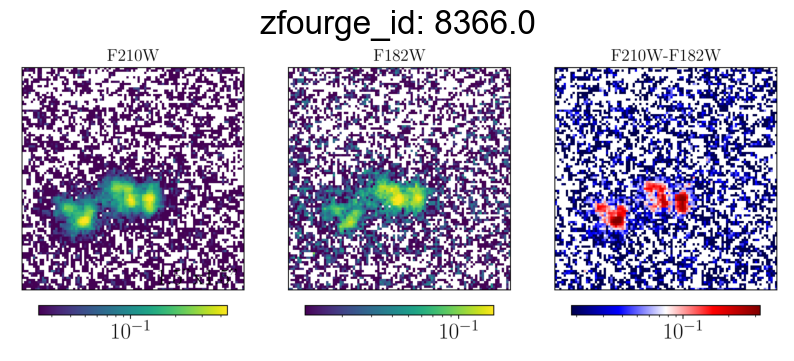

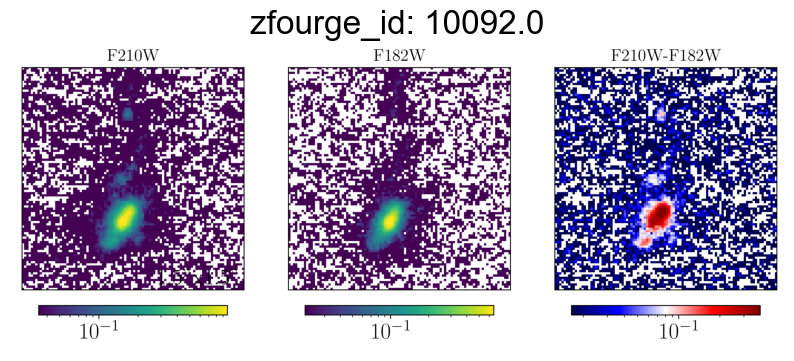

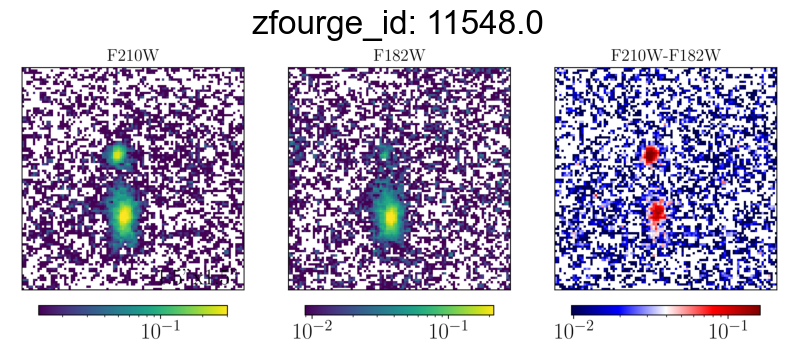

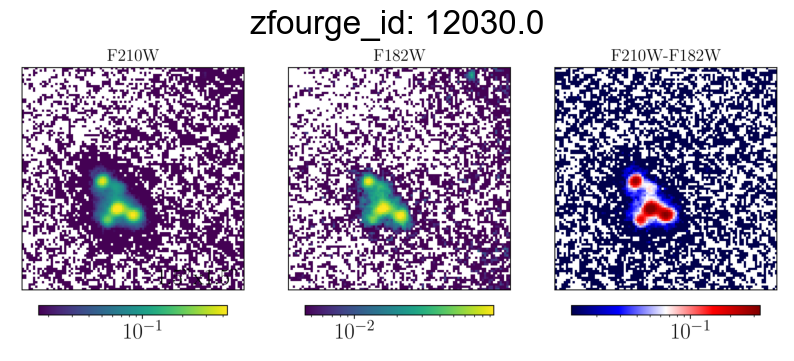

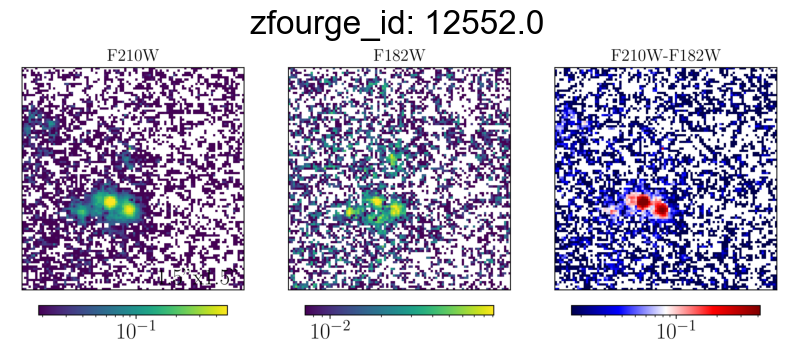

...

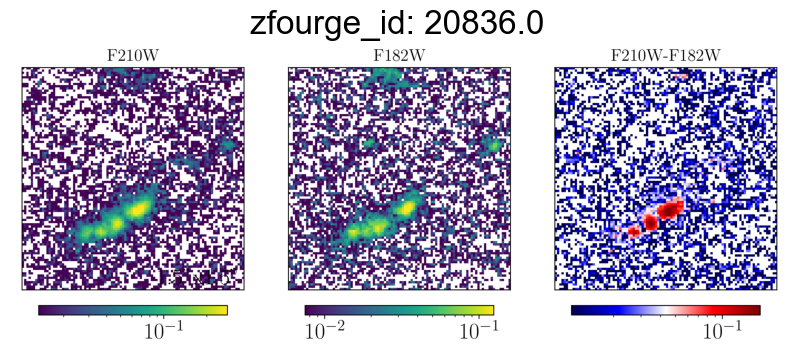

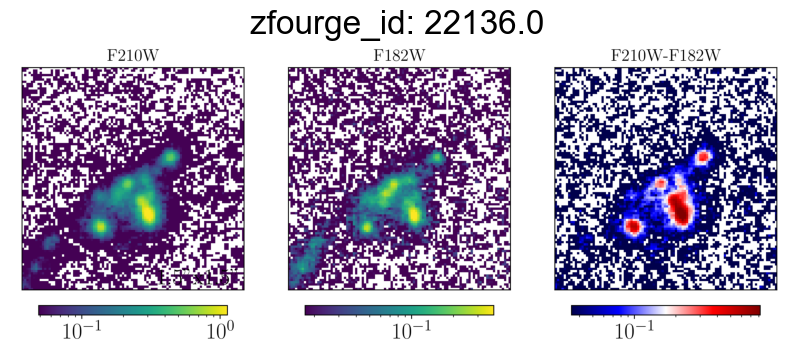

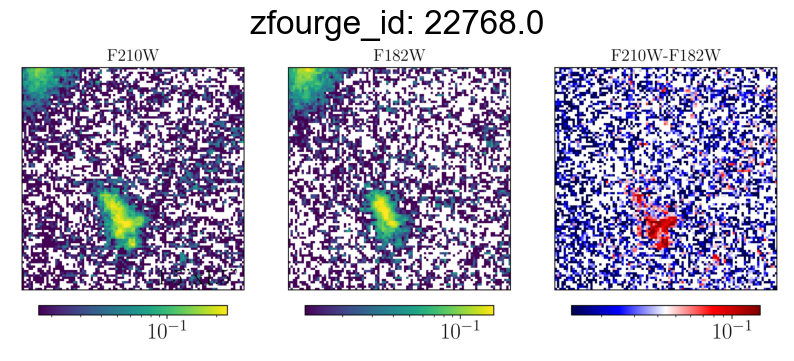

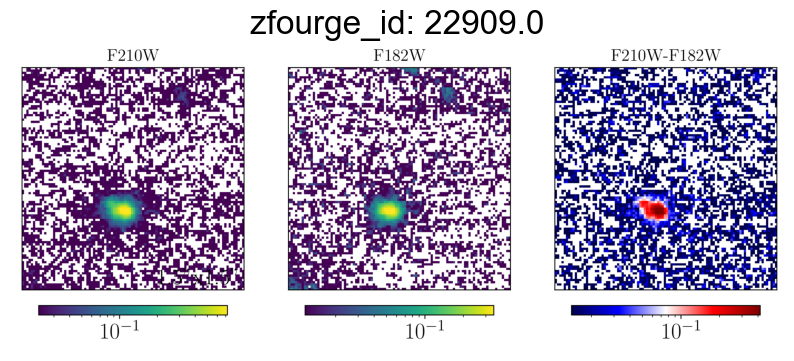

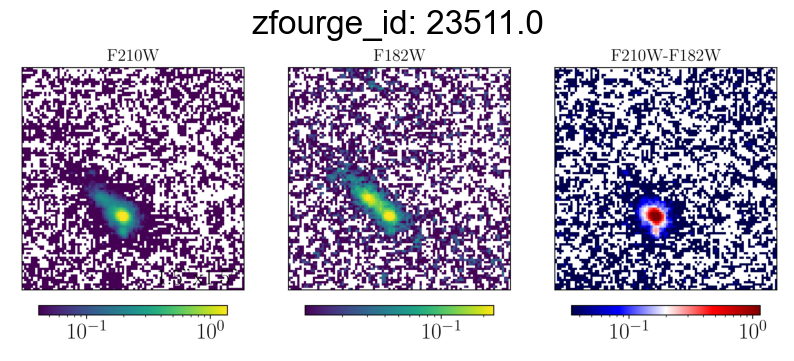

In [24]:
# Define image folder
image_folder = "C:/Users/aleje/Documents/Mimic_Galaxy_Data/Galaxy_Pictures/PNGS"

# Image position
for index, row in e_m_n_new_compar_gal.iterrows():
    image_path = "{}/fresco_{}_pseudo_o3_map.png".format(image_folder, row['zfourge_id'])
    img = plt.imread(image_path)
    
    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    
    # Display the zfourge_id as the title
    plt.title(f'zfourge_id: {row["zfourge_id"]}')
    
    plt.axis('off')
    plt.show()

In [25]:
# Make a fresh copy of c_m_n_new
c_m_n_new_sorted = c_m_n_new.copy()

# Calculate merger status for each condition C-M-N
merger_YN_for_f180 = (c_m_n_new_sorted['gini_f180'] > y_merger_cmn_180)
c_m_n_new_sorted.loc[:, 'merger_status_for_f180'] = np.where(merger_YN_for_f180, 'merger', 'non-merger')

merger_YN_for_o3 = (c_m_n_new_sorted['gini_o3'] > y_merger_cmn_o3)
c_m_n_new_sorted.loc[:, 'merger_status_for_o3'] = np.where(merger_YN_for_o3, 'merger', 'non-merger')

merger_YN_for_f210 = (c_m_n_new_sorted['gini_f210'] > y_merger_cmn)
c_m_n_new_sorted.loc[:, 'merger_status_for_f210'] = np.where(merger_YN_for_f210, 'merger', 'non-merger')

# Define the new column order
new_merg_inc_col_order = ['zfourge_id', 'm20_f210', 'gini_f210', 'merger_status_for_f210', 'm20_f180', 'gini_f180', 'merger_status_for_f180', 'm20_o3', 'gini_o3', 'merger_status_for_o3']

# Reorder columns in the DataFrame
c_m_n_new_compar_gal = c_m_n_new_sorted[new_merg_inc_col_order].copy()

# Order rows by ID
c_m_n_new_compar_gal = c_m_n_new_compar_gal.sort_values(by='zfourge_id')

display(c_m_n_new_compar_gal)

,zfourge_id,m20_f210,gini_f210,merger_status_for_f210,m20_f180,gini_f180,merger_status_for_f180,m20_o3,gini_o3,merger_status_for_o3
0,7129.0,-1.058603,0.441271,non-merger,-1.017542,0.497222,merger,-1.005570,0.448413,non-merger
2,7387.0,-1.199679,0.497966,merger,-1.083396,0.501942,merger,-1.034612,0.462332,non-merger
3,7448.0,-1.174389,0.506200,merger,-1.122201,0.512613,merger,-1.077316,0.423686,non-merger
4,7453.0,-1.989352,0.511446,non-merger,-2.028508,0.487705,non-merger,-1.934906,0.494922,non-merger
5,7629.0,-0.997026,0.512924,merger,-1.119062,0.460673,non-merger,-1.094217,0.572943,merger
6,7706.0,-1.203221,0.347752,non-merger,-1.501289,0.373557,non-merger,-0.791596,0.396025,non-merger
7,7814.0,-1.602603,0.488251,non-merger,-1.562979,0.519984,non-merger,-1.127005,0.458173,non-merger
8,7836.0,-1.107727,0.497412,merger,-1.016963,0.497955,merger,-1.362411,0.510473,non-merger
9,7856.0,-1.151656,0.513162,merger,-1.101272,0.514745,merger,-0.881260,0.425760,non-merger
10,7867.0,-0.964990,0.438009,non-merger,-0.943227,0.463797,merger,-0.979376,0.431942,non-merger


In [26]:
# Make a copy of c_m_n_new to edit
c_m_n_new_short = c_m_n_new.copy()

# Add the new merger status columns
c_m_n_new_short.loc[:, 'merger_status_for_f180'] = np.where(merger_YN_for_f180, 'merger', 'non-merger')
c_m_n_new_short.loc[:, 'merger_status_for_o3'] = np.where(merger_YN_for_o3, 'merger', 'non-merger')

short_control_col_order = ['zfourge_id', 'm20_f180', 'gini_f180', 'merger_status_for_f180', 'm20_o3', 'gini_o3', 'merger_status_for_o3']

# The conditions for different classifications & different copys to display 
both_mergers_180o3 = (c_m_n_new['gini_f180'] > y_merger_cmn_180) & (c_m_n_new['gini_o3'] > y_merger_cmn_o3)
both_mergers_180o3_table = c_m_n_new_short[both_mergers_180o3]
both_mergers_180o3_table = both_mergers_180o3_table[short_control_col_order].copy()

only_gas_180o3 = (c_m_n_new['gini_f180'] <= y_merger_cmn_180) & (c_m_n_new['gini_o3'] > y_merger_cmn_o3)
only_gas_180o3_table = c_m_n_new_short[only_gas_180o3]
only_gas_180o3_table = only_gas_180o3_table[short_control_col_order].copy()

only_stars_180o3 = (c_m_n_new['gini_f180'] > y_merger_cmn_180) & (c_m_n_new['gini_o3'] <= y_merger_cmn_o3)
only_stars_180o3_table = c_m_n_new_short[only_stars_180o3]
only_stars_180o3_table = only_stars_180o3_table[short_control_col_order].copy()

never_mergers_180o3 = (c_m_n_new['gini_f180'] <= y_merger_cmn_180) & (c_m_n_new['gini_o3'] <= y_merger_cmn_o3)
never_mergers_180o3_table = c_m_n_new_short[never_mergers_180o3]
never_mergers_180o3_table = never_mergers_180o3_table[short_control_col_order].copy()

# Shows tables and number of galaxies in each
display(both_mergers_180o3_table)
print(len(both_mergers_180o3_table))

display(only_gas_180o3_table)
print(len(only_gas_180o3_table))

display(only_stars_180o3_table)
print(len(only_stars_180o3_table))

display(never_mergers_180o3_table)
print(len(never_mergers_180o3_table))

,zfourge_id,m20_f180,gini_f180,merger_status_for_f180,m20_o3,gini_o3,merger_status_for_o3
17,8131.0,-1.277588,0.514808,merger,-0.815036,0.517362,merger
26,8851.0,-1.338852,0.530687,merger,-0.808007,0.470307,merger
30,9048.0,-1.173257,0.545842,merger,-1.504528,0.617783,merger
37,9512.0,-0.849756,0.451319,merger,-1.467450,0.567972,merger
39,9586.0,-0.947367,0.552138,merger,-0.739891,0.583662,merger
46,10017.0,-1.202908,0.505668,merger,-0.699718,0.470064,merger
57,10388.0,-1.091543,0.503791,merger,-0.992225,0.479208,merger
59,10415.0,-1.342495,0.535168,merger,-1.213259,0.575627,merger
106,12768.0,-1.127046,0.495780,merger,-0.977420,0.485392,merger
108,12824.0,-0.837405,0.491648,merger,-1.230850,0.542237,merger


20


,zfourge_id,m20_f180,gini_f180,merger_status_for_f180,m20_o3,gini_o3,merger_status_for_o3
5,7629.0,-1.119062,0.460673,non-merger,-1.094217,0.572943,merger
11,7887.0,-1.414118,0.482568,non-merger,-0.650780,0.421226,merger
18,8206.0,-1.908288,0.512308,non-merger,-1.074332,0.524917,merger
19,8207.0,-1.908137,0.535502,non-merger,-0.646975,0.499090,merger
27,8926.0,-1.747372,0.529508,non-merger,-1.558017,0.558327,merger
38,9576.0,-1.070937,0.391551,non-merger,-1.003305,0.549025,merger
41,9698.0,-1.661802,0.489569,non-merger,-0.965858,0.476674,merger
42,9805.0,-1.528197,0.528438,non-merger,-1.493762,0.550577,merger
44,9845.0,-1.454688,0.494437,non-merger,-1.121860,0.535619,merger
60,10489.0,-1.830816,0.511289,non-merger,-1.007897,0.486737,merger


30


,zfourge_id,m20_f180,gini_f180,merger_status_for_f180,m20_o3,gini_o3,merger_status_for_o3
0,7129.0,-1.017542,0.497222,merger,-1.005570,0.448413,non-merger
2,7387.0,-1.083396,0.501942,merger,-1.034612,0.462332,non-merger
3,7448.0,-1.122201,0.512613,merger,-1.077316,0.423686,non-merger
8,7836.0,-1.016963,0.497955,merger,-1.362411,0.510473,non-merger
9,7856.0,-1.101272,0.514745,merger,-0.881260,0.425760,non-merger
10,7867.0,-0.943227,0.463797,merger,-0.979376,0.431942,non-merger
13,7968.0,-1.999797,0.615309,merger,-1.545138,0.505730,non-merger
31,9087.0,-1.160666,0.527678,merger,-1.482531,0.522170,non-merger
32,9101.0,-1.352020,0.544469,merger,-1.688646,0.537930,non-merger
63,10677.0,-1.155230,0.516308,merger,-1.426626,0.434588,non-merger


24


,zfourge_id,m20_f180,gini_f180,merger_status_for_f180,m20_o3,gini_o3,merger_status_for_o3
4,7453.0,-2.028508,0.487705,non-merger,-1.934906,0.494922,non-merger
6,7706.0,-1.501289,0.373557,non-merger,-0.791596,0.396025,non-merger
7,7814.0,-1.562979,0.519984,non-merger,-1.127005,0.458173,non-merger
12,7932.0,-1.835667,0.533084,non-merger,-1.606863,0.485612,non-merger
14,8020.0,-1.676565,0.459390,non-merger,-1.293904,0.447982,non-merger
15,8074.0,-1.318778,0.512740,non-merger,-1.570326,0.459849,non-merger
16,8116.0,-1.639389,0.435231,non-merger,-1.056756,0.414369,non-merger
20,8316.0,-0.936492,0.453619,non-merger,-1.249326,0.462447,non-merger
28,8943.0,-1.244697,0.473888,non-merger,-1.406594,0.468027,non-merger
29,8946.0,-1.621943,0.531594,non-merger,-1.644782,0.496416,non-merger


82


In [27]:
# Creating a table with only selected control galaxies for my PPT
control_PPT_selected_ids = [7129.0, 7453.0, 7629.0, 8074.0, 8207.0, 8946.0, 9048.0, 9087.0, 9323.0, 10017.0, 10224.0, 10388.0, 12824.0, 12856.0, 14672.0, 16551.0, 16705.0, 18514.0, 22590.0, 22654.0]
control_PPT_selected_rows = c_m_n_new_compar_gal[c_m_n_new_compar_gal['zfourge_id'].isin(control_PPT_selected_ids)]

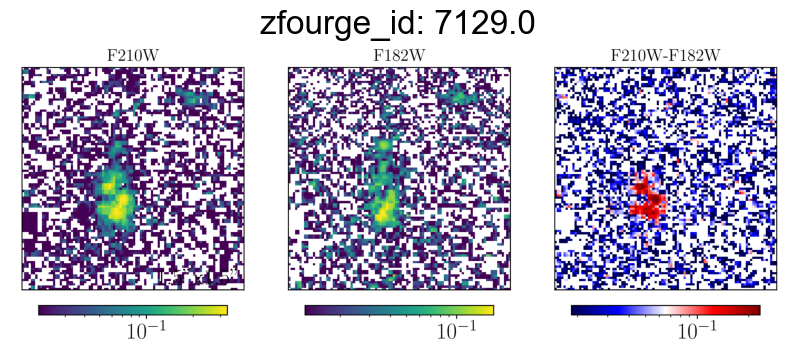

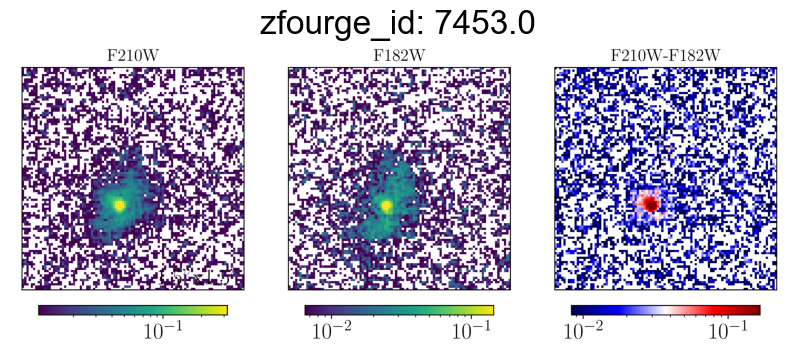

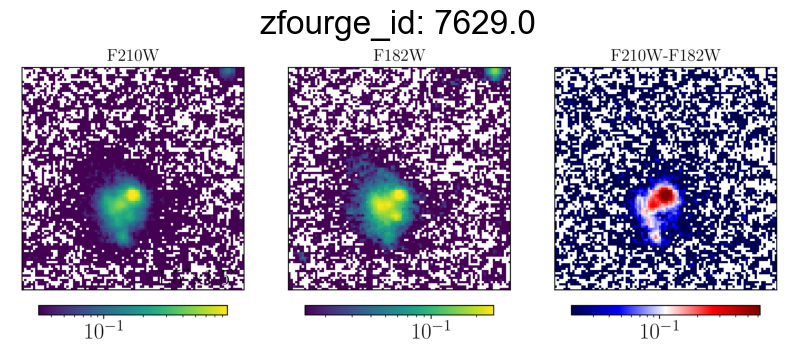

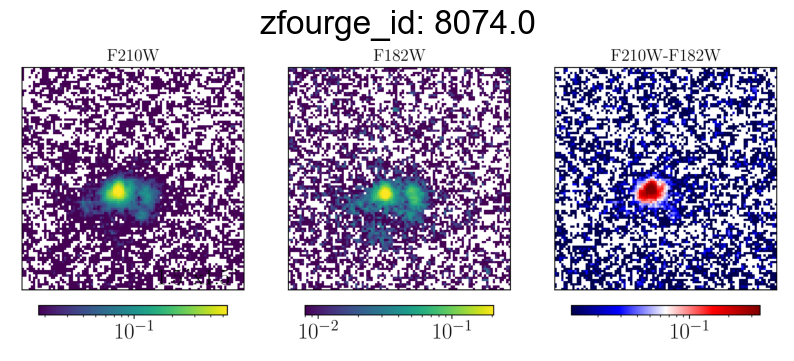

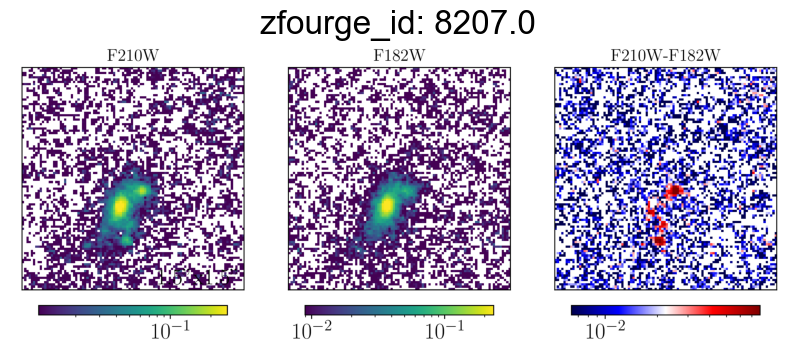

...

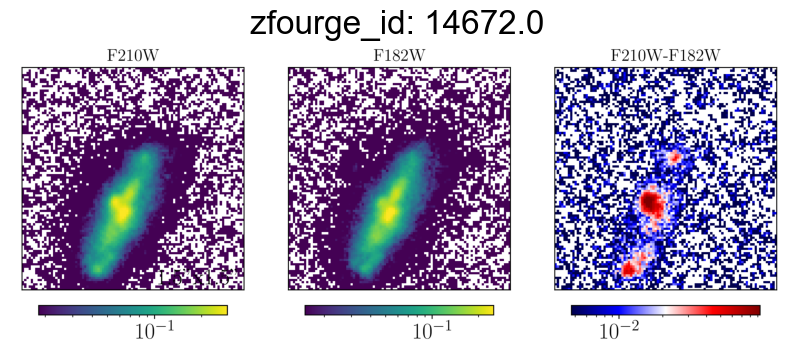

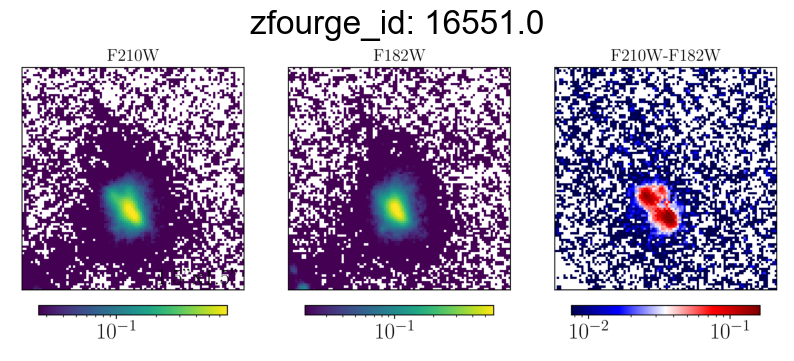

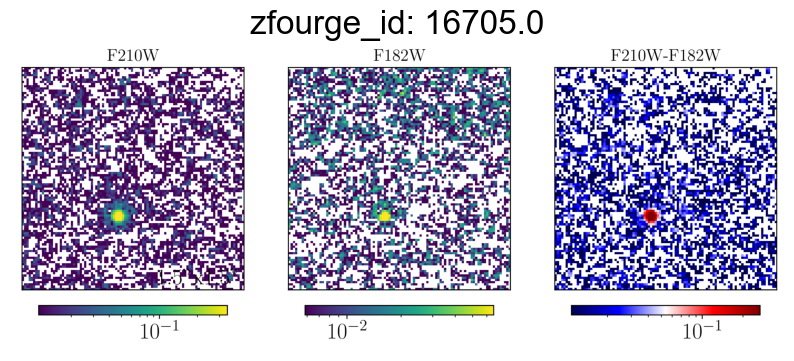

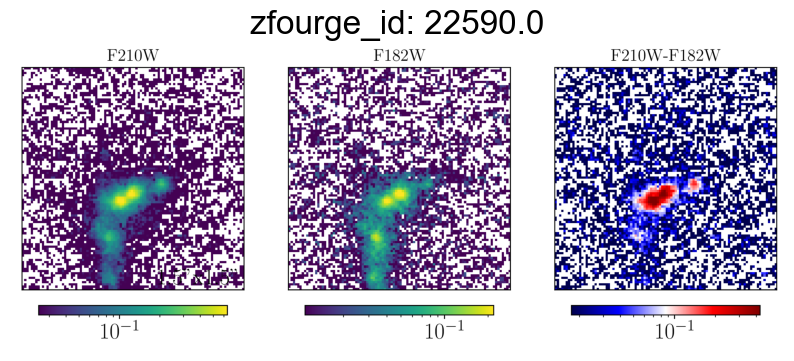

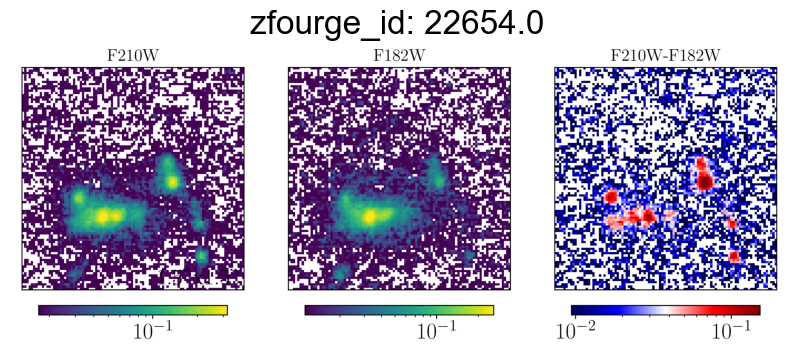

In [28]:
# Define image folder
image_folder = "C:/Users/aleje/Documents/Mimic_Galaxy_Data/Galaxy_Pictures/PNGS/Control_PNGs"

# Image position
for index, row in control_PPT_selected_rows.iterrows():
    image_path = "{}/fresco_{}_pseudo_o3_map.png".format(image_folder, row['zfourge_id'])
    img = plt.imread(image_path)
    
    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    
    # Display the zfourge_id as the title
    plt.title(f'zfourge_id: {row["zfourge_id"]}')
    
    plt.axis('off')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


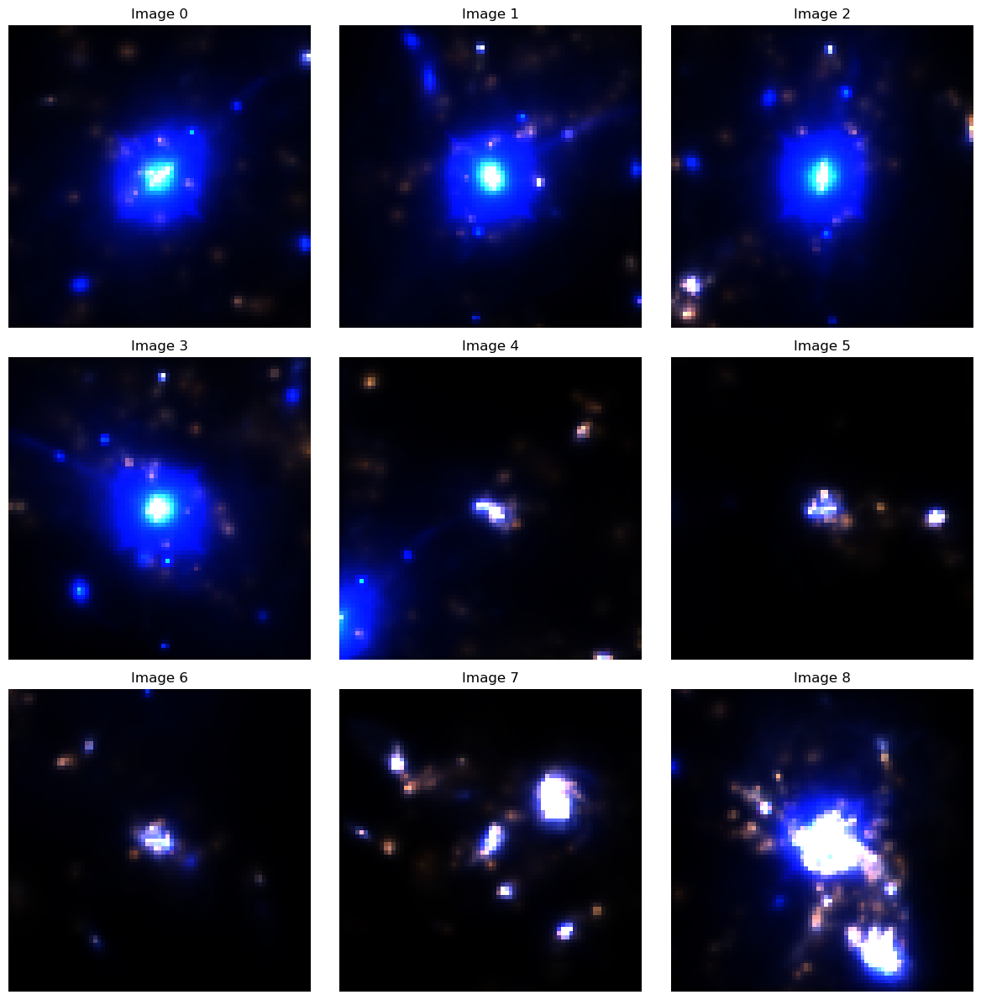

In [13]:
model_DM_path = r"C:\Users\aleje\OneDrive - Curtin\Uni Y3\ICRAR Intern\hlsp_deepmerge_hst-jwst_acs-wfc3-nircam_illustris-z2_f814w-f160w-f356w_v1_sim-pristine-x.npy"
data_DM_np = np.load(model_DM_path)

num_images = 9
images = data_DM_np[:num_images]  # Select the first few images

# Set up the grid
fig, axes = plt.subplots(3, 3, figsize=(12, 12))  # 3x3 grid
for i, ax in enumerate(axes.flat):
    image = images[i]
    image = np.transpose(image, (1, 2, 0))  # Reshape to (height, width, channels)
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(f"Image {i}")
plt.tight_layout()
plt.show()